In [1]:
import pandas as pd
import numpy as np
import plotly.express as px #libary to plot data with interaction like zoom in and out 
import seaborn as sns

In [2]:
import warnings 
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('bovino_monthly.csv')

In [4]:
df.head()

,DATAFLOW,LAST UPDATE,freq,meat,meatitem,unit,geo,TIME_PERIOD,OBS_VALUE,OBS_FLAG
0,ESTAT:APRO_MT_PHEADM(1.0),27/11/24 23:00:00,Monthly,Bovine meat,Slaughterings,Thousand tonnes,Albania,2015-01,0.66,NaN
1,ESTAT:APRO_MT_PHEADM(1.0),27/11/24 23:00:00,Monthly,Bovine meat,Slaughterings,Thousand tonnes,Albania,2015-02,0.58,NaN
2,ESTAT:APRO_MT_PHEADM(1.0),27/11/24 23:00:00,Monthly,Bovine meat,Slaughterings,Thousand tonnes,Albania,2015-03,0.67,NaN
3,ESTAT:APRO_MT_PHEADM(1.0),27/11/24 23:00:00,Monthly,Bovine meat,Slaughterings,Thousand tonnes,Albania,2015-04,0.68,NaN
4,ESTAT:APRO_MT_PHEADM(1.0),27/11/24 23:00:00,Monthly,Bovine meat,Slaughterings,Thousand tonnes,Albania,2015-05,0.71,NaN


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6254 entries, 0 to 6253
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATAFLOW     6254 non-null   object 
 1   LAST UPDATE  6254 non-null   object 
 2   freq         6254 non-null   object 
 3   meat         6254 non-null   object 
 4   meatitem     6254 non-null   object 
 5   unit         6254 non-null   object 
 6   geo          6254 non-null   object 
 7   TIME_PERIOD  6254 non-null   object 
 8   OBS_VALUE    6246 non-null   float64
 9   OBS_FLAG     475 non-null    object 
dtypes: float64(1), object(9)
memory usage: 488.7+ KB


In [6]:
df['geo'].unique()

array(['Albania', 'Austria', 'Bosnia and Herzegovina', 'Belgium',
       'Bulgaria', 'Switzerland', 'Cyprus', 'Czechia', 'Germany',
       'Denmark', 'Estonia', 'Greece', 'Spain',
       'European Union - 27 countries (from 2020)', 'Finland', 'France',
       'Croatia', 'Hungary', 'Ireland', 'Iceland', 'Italy', 'Lithuania',
       'Luxembourg', 'Latvia', 'Montenegro', 'North Macedonia', 'Malta',
       'Netherlands', 'Poland', 'Portugal', 'Romania', 'Serbia', 'Sweden',
       'Slovenia', 'Slovakia', 'Türkiye', 'United Kingdom', 'Kosovo*'],
      dtype=object)

In [7]:
df['TIME_PERIOD'].unique()

array(['2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-06',
       '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2015-12',
       '2016-01', '2016-02', '2016-03', '2016-04', '2016-05', '2016-06',
       '2016-07', '2016-08', '2016-09', '2016-10', '2016-11', '2016-12',
       '2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06',
       '2017-07', '2017-08', '2017-09', '2017-10', '2017-11', '2017-12',
       '2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06',
       '2018-07', '2018-08', '2018-09', '2018-10', '2018-11', '2018-12',
       '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06',
       '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12',
       '2020-01', '2020-02', '2020-03', '2020-04', '2020-05', '2020-06',
       '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12',
       '2021-01', '2021-02', '2021-03', '2021-04', '2021-05', '2021-06',
       '2021-07', '2021-08', '2021-09', '2021-10', 

In [8]:
df.isnull().sum()

DATAFLOW          0
LAST UPDATE       0
freq              0
meat              0
meatitem          0
unit              0
geo               0
TIME_PERIOD       0
OBS_VALUE         8
OBS_FLAG       5779
dtype: int64

In [9]:
null_data = df[df.isnull().any(axis=1)]
print(null_data)

                       DATAFLOW        LAST UPDATE     freq         meat  \
0     ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
1     ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
2     ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
3     ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
4     ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
...                         ...                ...      ...          ...   
6249  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
6250  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
6251  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
6252  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
6253  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   

           meatitem             unit      geo TIME_PERIOD  OBS_VALUE OBS_FLAG  
0     S

In [10]:
#I need to drop OBS_FLAG first
df = df.drop(['OBS_FLAG'], axis=1)

In [11]:
null_data = df[df.isnull().any(axis=1)]
print(null_data)

                       DATAFLOW        LAST UPDATE     freq         meat  \
595   ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
597   ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
599   ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
1662  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
2147  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
2149  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
2151  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   
2191  ESTAT:APRO_MT_PHEADM(1.0)  27/11/24 23:00:00  Monthly  Bovine meat   

           meatitem             unit  \
595   Slaughterings  Thousand tonnes   
597   Slaughterings  Thousand tonnes   
599   Slaughterings  Thousand tonnes   
1662  Slaughterings  Thousand tonnes   
2147  Slaughterings  Thousand tonnes   
2149  Slaughterings  Thousand tonnes   
2151  Slaughterings  Thousand tonne

In [12]:
#filtered_data = df[df['TIME_PERIOD'] == 2014]

# Display the filtered rows
#print(filtered_data)

In [13]:
#I will drop all the rows EU27_2020, cause I want to compare countries only 
df = df[df['geo'] != 'European Union - 27 countries (from 2020)']

In [14]:
df.loc[:,'OBS_VALUE'] = df['OBS_VALUE'].fillna(0)

In [15]:
df.isnull().sum()

DATAFLOW       0
LAST UPDATE    0
freq           0
meat           0
meatitem       0
unit           0
geo            0
TIME_PERIOD    0
OBS_VALUE      0
dtype: int64

In [16]:
# I will drop collumns DATAFLOW, LAST UPDATE, freq, unit, meatitem, meat
df = df.drop(['DATAFLOW','LAST UPDATE','freq','unit','meatitem','meat'], axis=1)

In [17]:
df.head()

,geo,TIME_PERIOD,OBS_VALUE
0,Albania,2015-01,0.66
1,Albania,2015-02,0.58
2,Albania,2015-03,0.67
3,Albania,2015-04,0.68
4,Albania,2015-05,0.71


In [18]:
df.rename(columns={'geo': 'Country','TIME_PERIOD':'Year','OBS_VALUE':'Value'}, inplace=True)

In [19]:
df['Year'] = pd.to_datetime(df['Year'])  # Convert to datetime format

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6078 entries, 0 to 6253
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Country  6078 non-null   object        
 1   Year     6078 non-null   datetime64[ns]
 2   Value    6078 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 189.9+ KB


In [21]:
df.head()

,Country,Year,Value
0,Albania,2015-01-01,0.66
1,Albania,2015-02-01,0.58
2,Albania,2015-03-01,0.67
3,Albania,2015-04-01,0.68
4,Albania,2015-05-01,0.71


In [22]:
import pycountry #libary with country codes in different formats


invalid_countries = []
# Create a function to convert country Name to country ISO_code, cause it will be required for the geo graphc
def get_alpha_3(country_code):
    #using try to avoid error in case doesnt find country code
    try:
        return pycountry.countries.lookup(country_code).alpha_3
    except LookupError:
        invalid_countries.append(country_code)  # collect countries not found
        return None  # Handle invalid country names

#call function in country column
df['ISO_Code'] = df['Country'].apply(get_alpha_3)
df

,Country,Year,Value,ISO_Code
0,Albania,2015-01-01,0.66,ALB
1,Albania,2015-02-01,0.58,ALB
2,Albania,2015-03-01,0.67,ALB
3,Albania,2015-04-01,0.68,ALB
4,Albania,2015-05-01,0.71,ALB
...,...,...,...,...
6249,Kosovo*,2023-08-01,0.54,None
6250,Kosovo*,2023-09-01,0.38,None
6251,Kosovo*,2023-10-01,0.73,None
6252,Kosovo*,2023-11-01,0.61,None


In [23]:
print("Invalid countries:", invalid_countries)

Invalid countries: ['Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', 'Kosovo*', '

In [24]:
#null_data = df[df.isnull().any(axis=1)] #I want to find if there is any country missing
#null_data['Country'].unique()

In [25]:
#According to the database structuer (https://ec.europa.eu/eurostat/databrowser/product/page/tag00044) 
# Kosovo iso_code is XKX
df.loc[df['Country'] == 'Kosovo*', 'ISO_Code'] = 'XKX'

In [26]:
null_data = df[df.isnull().any(axis=1)]
null_data

,Country,Year,Value,ISO_Code


In [27]:
null_data = df[df.isnull().any(axis=1)]
print(null_data)

Empty DataFrame
Columns: [Country, Year, Value, ISO_Code]
Index: []


In [28]:
df.head()

,Country,Year,Value,ISO_Code
0,Albania,2015-01-01,0.66,ALB
1,Albania,2015-02-01,0.58,ALB
2,Albania,2015-03-01,0.67,ALB
3,Albania,2015-04-01,0.68,ALB
4,Albania,2015-05-01,0.71,ALB


In [29]:
df.tail()

,Country,Year,Value,ISO_Code
6249,Kosovo*,2023-08-01,0.54,XKX
6250,Kosovo*,2023-09-01,0.38,XKX
6251,Kosovo*,2023-10-01,0.73,XKX
6252,Kosovo*,2023-11-01,0.61,XKX
6253,Kosovo*,2023-12-01,1.18,XKX


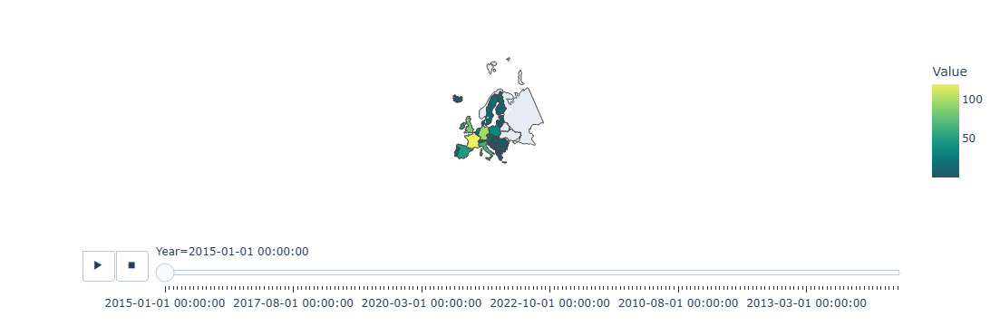

In [30]:
# aggrnyl     agsunset    blackbody   bluered     blues       blugrn      bluyl       brwnyl
# bugn        bupu        burg        burgyl      cividis     darkmint    electric    emrld
# gnbu        greens      greys       hot         inferno     jet         magenta     magma
# mint        orrd        oranges     oryel       peach       pinkyl      plasma      plotly3
# pubu        pubugn      purd        purp        purples     purpor      rainbow     rdbu
# rdpu        redor       reds        sunset      sunsetdark  teal        tealgrn     turbo
# viridis     ylgn        ylgnbu      ylorbr      ylorrd      algae       amp         deep
# dense       gray        haline      ice         matter      solar       speed       tempo
# thermal     turbid      armyrose    brbg        earth       fall        geyser      prgn
# piyg        picnic      portland    puor        rdgy        rdylbu      rdylgn      spectral
# tealrose    temps       tropic      balance     curl        delta       oxy         edge
# hsv         icefire     phase       twilight    mrybm       mygbm

fig= px.choropleth(df, locations="ISO_Code", color="Value",
                   hover_name = 'Country',
                   animation_frame = 'Year',
                   color_continuous_scale = px.colors.sequential.Aggrnyl)
fig.update_layout(geo_scope='europe')

fig.show()

In [31]:
df = df.sort_values(by="Year")  # sort it by year 

In [32]:
df['Year_Month'] = df['Year'].dt.strftime('%Y-%m')  # Extract Year and Month in 'YYYY-MM' format

In [33]:
df

,Country,Year,Value,ISO_Code,Year_Month
1963,Spain,2010-01-01,47.14,ESP,2010-01
4486,Netherlands,2010-01-01,27.48,NLD,2010-01
3354,Italy,2010-01-01,95.76,ITA,2010-01
1256,Germany,2010-01-01,93.91,DEU,2010-01
4662,Poland,2010-01-01,22.81,POL,2010-01
...,...,...,...,...,...
5521,Sweden,2024-09-01,12.26,SWE,2024-09
3884,Luxembourg,2024-09-01,0.78,LUX,2024-09
2491,Finland,2024-09-01,7.34,FIN,2024-09
3353,Iceland,2024-10-01,0.50,ISL,2024-10


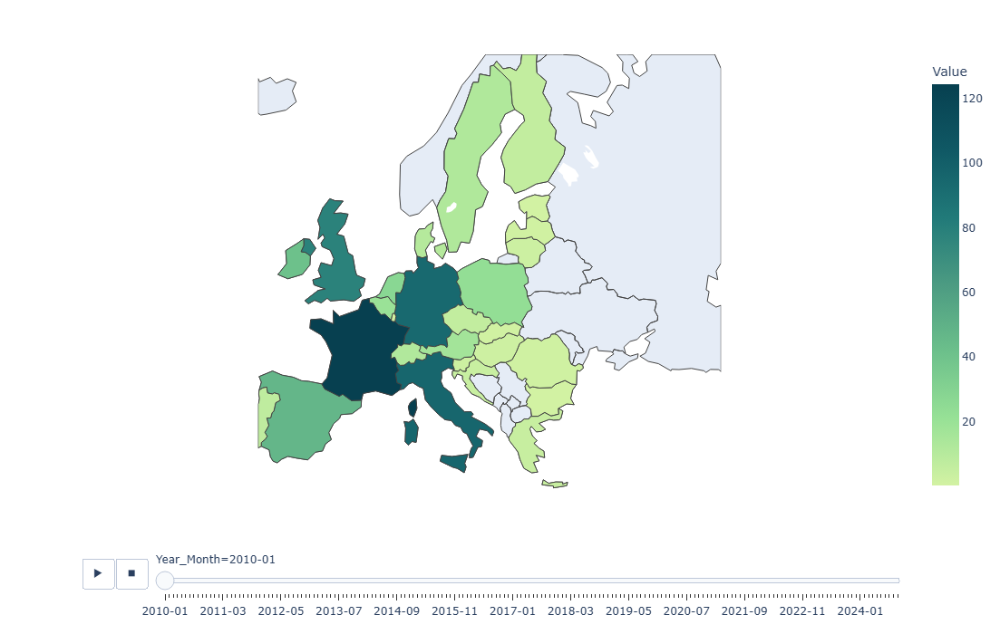

In [34]:
#making it look better
fig= px.choropleth(df, locations="ISO_Code", color="Value",
                   hover_name = 'Country',
                   animation_frame = 'Year_Month',
                   color_continuous_scale = px.colors.sequential.Emrld)
fig.update_layout(geo_scope='europe',width=1000, height=700)

fig.show()

In [35]:
# alot of countries have missing value in the table but not showing as NAN, cause the rows are not in the table,
# they just start at 2015
df['Country'].value_counts()

Country
Belgium                   178
Latvia                    177
Malta                     177
Finland                   177
Lithuania                 177
Czechia                   177
Estonia                   177
Croatia                   177
Sweden                    177
Hungary                   177
France                    177
Romania                   177
Denmark                   177
Ireland                   177
Portugal                  177
Luxembourg                177
Cyprus                    177
Germany                   177
Italy                     177
Spain                     176
Slovakia                  176
Austria                   176
Netherlands               176
Greece                    176
Slovenia                  176
Bulgaria                  176
Poland                    176
Iceland                   154
Türkiye                   153
Serbia                    153
Switzerland               139
United Kingdom            131
Montenegro                128
No

In [36]:
#df_short = df[df['Year'] > '2014-12-01']

#df_short['Country'].value_counts()

In [37]:
#I will remove countries with less than 116

# countries_to_drop = [
#     'Switzerland', 'Montenegro', 'North Macedonia', 
#     'Bosnia and Herzegovina', 'Kosovo*','United Kingdom'
# ]

# # Drop rows where the 'Country' column matches any of the countries in the list
# df_short = df_short[~df_short['Country'].isin(countries_to_drop)]

# # Check the remaining rows
# print(df_short['Country'].value_counts()) 

                   Country     Value
0                  Albania     72.41
1                  Austria   3238.03
2                  Belgium   3862.09
3   Bosnia and Herzegovina    130.84
4                 Bulgaria     88.15
5                  Croatia    666.03
6                   Cyprus     75.79
7                  Czechia   1029.13
8                  Denmark   1833.82
9                  Estonia    125.69
10                 Finland   1244.32
11                  France  21113.62
12                 Germany  16208.08
13                  Greece    629.78
14                 Hungary    386.21
15                 Iceland     59.56
16                 Ireland   8604.80
17                   Italy  11906.16
18                 Kosovo*     97.85
19                  Latvia    238.76
20               Lithuania    611.59
21              Luxembourg    138.31
22                   Malta     16.44
23              Montenegro     58.63
24             Netherlands   6027.42
25         North Macedonia      6.98
2

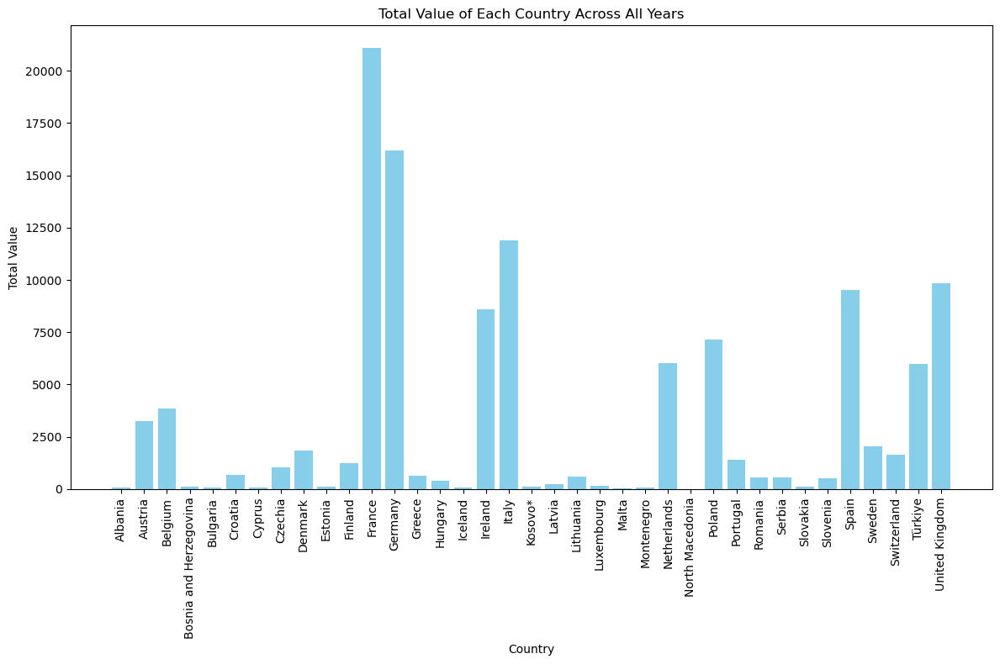

In [38]:
import matplotlib.pyplot as plt #libary to generate plot
# Group by 'Country' and sum the 'Value' column for each country
country_sum = df.groupby('Country')['Value'].sum().reset_index()

print(country_sum)

plt.figure(figsize=(12, 8))  # Set the figure size
plt.bar(country_sum['Country'], country_sum['Value'], color='skyblue')

plt.xlabel('Country')
plt.ylabel('Total Value')
plt.title('Total Value of Each Country Across All Years')

plt.xticks(rotation=90) # it was not possible to read in 45
plt.tight_layout()  #prevent overlap

plt.show()

In [39]:
#I will apply Clustering to create groups and see with which countries it will be better to compare with Ireland

#pivoted_data2 = df.pivot(index='Year', columns='Country', values='Value') #adapting the datas by country
pivoted_data = df.pivot(index='Country', columns='Year', values='Value') #reorganazing the data 

pivoted_data

Year,2010-01-01,2010-02-01,2010-03-01,2010-04-01,2010-05-01,2010-06-01,2010-07-01,2010-08-01,2010-09-01,2010-10-01,...,2024-01-01,2024-02-01,2024-03-01,2024-04-01,2024-05-01,2024-06-01,2024-07-01,2024-08-01,2024-09-01,2024-10-01
Country,,,,,,,,,,,,,,,,,,,,,
Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.42,0.37,0.48,0.59,0.59,0.48,0.54,0.65,0.59,NaN
Austria,16.84,16.05,20.26,18.34,17.89,17.63,15.96,19.08,18.91,20.11,...,17.63,16.13,16.91,17.56,16.44,14.78,15.83,15.16,NaN,NaN
Belgium,19.80,18.54,22.01,21.27,21.54,20.83,19.07,22.49,22.75,23.40,...,21.77,19.30,20.94,21.37,21.58,19.53,19.46,21.10,20.91,21.99
Bosnia and Herzegovina,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.70,0.66,0.71,0.86,0.66,0.88,0.68,0.76,0.76,NaN
Bulgaria,0.35,0.37,0.38,0.38,0.38,0.31,0.35,0.28,0.00,0.41,...,0.76,0.66,0.63,0.56,0.53,0.55,0.49,0.40,NaN,NaN
Croatia,3.83,3.79,4.90,4.08,4.50,4.54,5.24,5.35,4.82,4.79,...,3.34,3.10,3.52,3.27,3.59,3.30,3.81,3.62,3.78,NaN
Cyprus,0.43,0.34,0.41,0.34,0.33,0.32,0.33,0.36,0.40,0.43,...,0.62,0.53,0.49,0.42,0.43,0.34,0.41,0.39,0.49,NaN
Czechia,5.93,5.57,6.30,6.44,6.18,6.03,5.36,5.91,6.09,6.50,...,6.17,5.70,5.57,5.95,5.75,5.00,5.16,5.34,5.72,NaN
Denmark,10.70,9.80,11.50,10.10,10.40,11.60,7.10,12.10,12.40,11.40,...,9.79,9.05,8.64,10.27,9.75,9.48,8.91,9.73,9.88,NaN


In [40]:
pivoted_data.isnull().sum()

Year
2010-01-01     8
2010-02-01     8
2010-03-01     8
2010-04-01     8
2010-05-01     8
              ..
2024-06-01     2
2024-07-01     2
2024-08-01     2
2024-09-01    10
2024-10-01    35
Length: 178, dtype: int64

In [41]:
#Almost all countries are misisng data for 2024-10-01
pivoted_data = pivoted_data.drop(columns=['2024-10-01'])

In [42]:
#There countries with no data, there were no rows for them in the original dat and now due pivot their columns shows as Nan

#I will reverse it and turn the year as index so I can fill in the missing values and interpolation
pivoted_data = pivoted_data.reset_index().melt(id_vars='Country', var_name='Year', value_name='Value')
pivoted_data = pivoted_data.pivot(index='Year', columns='Country', values='Value')

In [43]:
pivoted_data

Country,Albania,Austria,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,...,Portugal,Romania,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Türkiye,United Kingdom
Year,,,,,,,,,,,,,,,,,,,,,
2010-01-01,NaN,16.84,19.80,NaN,0.35,3.83,0.43,5.93,10.70,0.63,...,7.21,1.40,NaN,1.24,2.64,47.14,12.14,12.07,NaN,78.09
2010-02-01,NaN,16.05,18.54,NaN,0.37,3.79,0.34,5.57,9.80,0.60,...,6.74,1.68,NaN,1.13,2.55,44.90,11.35,10.80,NaN,71.09
2010-03-01,NaN,20.26,22.01,NaN,0.38,4.90,0.41,6.30,11.50,0.78,...,8.65,2.30,NaN,1.22,3.33,50.86,13.16,13.45,NaN,70.37
2010-04-01,NaN,18.34,21.27,NaN,0.38,4.08,0.34,6.44,10.10,0.73,...,6.89,2.09,NaN,1.12,2.87,47.25,11.33,11.97,NaN,85.27
2010-05-01,NaN,17.89,21.54,NaN,0.38,4.50,0.33,6.18,10.40,0.74,...,7.98,2.48,NaN,1.23,2.80,50.64,11.65,11.62,NaN,69.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-01,0.59,16.44,21.58,0.66,0.53,3.59,0.43,5.75,9.75,0.58,...,9.63,2.46,3.31,0.62,2.52,66.46,11.44,12.03,34.66,NaN
2024-06-01,0.48,14.78,19.53,0.88,0.55,3.30,0.34,5.00,9.48,0.50,...,8.54,2.47,3.33,0.49,1.99,56.78,9.65,10.40,33.89,NaN
2024-07-01,0.54,15.83,19.46,0.68,0.49,3.81,0.41,5.16,8.91,0.61,...,9.54,2.99,3.58,0.55,2.07,64.53,11.22,10.97,35.01,NaN


In [44]:
pivoted_data.isnull().sum()

Country
Albania                   60
Austria                    1
Belgium                    0
Bosnia and Herzegovina    61
Bulgaria                   1
Croatia                    0
Cyprus                     0
Czechia                    0
Denmark                    0
Estonia                    0
Finland                    0
France                     0
Germany                    0
Greece                     1
Hungary                    0
Iceland                   24
Ireland                    0
Italy                      0
Kosovo*                   81
Latvia                     0
Lithuania                  0
Luxembourg                 0
Malta                      0
Montenegro                49
Netherlands                1
North Macedonia           58
Poland                     1
Portugal                   0
Romania                    0
Serbia                    24
Slovakia                   1
Slovenia                   1
Spain                      1
Sweden                     0
Switze

In [45]:
#Imputation

#pivoted_data = pivoted_data.fillna(method='ffill').fillna(method='bfill') #it goes foward and back through the whole data 
#copying the previous value in the missing value(s)
#I tried ffill and bfill method as my first method to deal with missing values, but the elbow curve was not so precise and it creates long lines
#for the countries with long line of missing data

In [46]:
from sklearn.impute import KNNImputer

#So I tested this KNNImputer where each missing value is estimated using the values of the nearest neighbors.
#it creates a more dynamic graph 

imputer = KNNImputer(n_neighbors=3)
pivoted_data[:] = imputer.fit_transform(pivoted_data)

In [47]:
pivoted_data

Country,Albania,Austria,Belgium,Bosnia and Herzegovina,Bulgaria,Croatia,Cyprus,Czechia,Denmark,Estonia,...,Portugal,Romania,Serbia,Slovakia,Slovenia,Spain,Sweden,Switzerland,Türkiye,United Kingdom
Year,,,,,,,,,,,,,,,,,,,,,
2010-01-01,1.183333,16.840000,19.80,1.480000,0.350000,3.83,0.43,5.93,10.70,0.63,...,7.21,1.40,2.740000,1.240000,2.640000,47.140000,12.14,12.07,33.583333,78.090000
2010-02-01,0.640000,16.050000,18.54,1.513333,0.370000,3.79,0.34,5.57,9.80,0.60,...,6.74,1.68,2.830000,1.130000,2.550000,44.900000,11.35,10.80,37.346667,71.090000
2010-03-01,1.213333,20.260000,22.01,1.633333,0.380000,4.90,0.41,6.30,11.50,0.78,...,8.65,2.30,3.056667,1.220000,3.330000,50.860000,13.16,13.45,33.700000,70.370000
2010-04-01,0.696667,18.340000,21.27,1.103333,0.380000,4.08,0.34,6.44,10.10,0.73,...,6.89,2.09,2.890000,1.120000,2.870000,47.250000,11.33,11.97,35.196667,85.270000
2010-05-01,0.780000,17.890000,21.54,1.946667,0.380000,4.50,0.33,6.18,10.40,0.74,...,7.98,2.48,3.053333,1.230000,2.800000,50.640000,11.65,11.62,42.380000,69.230000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-01,0.590000,16.440000,21.58,0.660000,0.530000,3.59,0.43,5.75,9.75,0.58,...,9.63,2.46,3.310000,0.620000,2.520000,66.460000,11.44,12.03,34.660000,74.000000
2024-06-01,0.480000,14.780000,19.53,0.880000,0.550000,3.30,0.34,5.00,9.48,0.50,...,8.54,2.47,3.330000,0.490000,1.990000,56.780000,9.65,10.40,33.890000,69.663333
2024-07-01,0.540000,15.830000,19.46,0.680000,0.490000,3.81,0.41,5.16,8.91,0.61,...,9.54,2.99,3.580000,0.550000,2.070000,64.530000,11.22,10.97,35.010000,74.000000


In [48]:
#turn it back where country is the index so I can clustering them
pivoted_data = pivoted_data.reset_index().melt(id_vars='Year', var_name='Country', value_name='Value')


In [49]:
pivoted_data

,Year,Country,Value
0,2010-01-01,Albania,1.183333
1,2010-02-01,Albania,0.640000
2,2010-03-01,Albania,1.213333
3,2010-04-01,Albania,0.696667
4,2010-05-01,Albania,0.780000
...,...,...,...
6544,2024-05-01,United Kingdom,74.000000
6545,2024-06-01,United Kingdom,69.663333
6546,2024-07-01,United Kingdom,74.000000
6547,2024-08-01,United Kingdom,73.140000


In [50]:
pivoted_data_final = pivoted_data.pivot(index='Country', columns='Year', values='Value')

In [51]:
pivoted_data_final

Year,2010-01-01,2010-02-01,2010-03-01,2010-04-01,2010-05-01,2010-06-01,2010-07-01,2010-08-01,2010-09-01,2010-10-01,...,2023-12-01,2024-01-01,2024-02-01,2024-03-01,2024-04-01,2024-05-01,2024-06-01,2024-07-01,2024-08-01,2024-09-01
Country,,,,,,,,,,,,,,,,,,,,,
Albania,1.183333,0.640000,1.213333,0.696667,0.780000,0.903333,0.563333,0.913333,1.416667,0.956667,...,0.720000,0.420000,0.370000,0.480000,0.590000,0.590000,0.480000,0.54,0.650000,0.590000
Austria,16.840000,16.050000,20.260000,18.340000,17.890000,17.630000,15.960000,19.080000,18.910000,20.110000,...,17.130000,17.630000,16.130000,16.910000,17.560000,16.440000,14.780000,15.83,15.160000,17.473333
Belgium,19.800000,18.540000,22.010000,21.270000,21.540000,20.830000,19.070000,22.490000,22.750000,23.400000,...,20.970000,21.770000,19.300000,20.940000,21.370000,21.580000,19.530000,19.46,21.100000,20.910000
Bosnia and Herzegovina,1.480000,1.513333,1.633333,1.103333,1.946667,1.480000,2.040000,1.460000,1.566667,1.433333,...,0.860000,0.700000,0.660000,0.710000,0.860000,0.660000,0.880000,0.68,0.760000,0.760000
Bulgaria,0.350000,0.370000,0.380000,0.380000,0.380000,0.310000,0.350000,0.280000,0.000000,0.410000,...,0.780000,0.760000,0.660000,0.630000,0.560000,0.530000,0.550000,0.49,0.400000,0.576667
Croatia,3.830000,3.790000,4.900000,4.080000,4.500000,4.540000,5.240000,5.350000,4.820000,4.790000,...,3.450000,3.340000,3.100000,3.520000,3.270000,3.590000,3.300000,3.81,3.620000,3.780000
Cyprus,0.430000,0.340000,0.410000,0.340000,0.330000,0.320000,0.330000,0.360000,0.400000,0.430000,...,0.510000,0.620000,0.530000,0.490000,0.420000,0.430000,0.340000,0.41,0.390000,0.490000
Czechia,5.930000,5.570000,6.300000,6.440000,6.180000,6.030000,5.360000,5.910000,6.090000,6.500000,...,5.840000,6.170000,5.700000,5.570000,5.950000,5.750000,5.000000,5.16,5.340000,5.720000
Denmark,10.700000,9.800000,11.500000,10.100000,10.400000,11.600000,7.100000,12.100000,12.400000,11.400000,...,8.970000,9.790000,9.050000,8.640000,10.270000,9.750000,9.480000,8.91,9.730000,9.880000


In [52]:
#pivoted_data.isnull().sum()
null_data = pivoted_data[pivoted_data.isnull().any(axis=1)]
print(null_data)

Empty DataFrame
Columns: [Year, Country, Value]
Index: []


In [53]:
from sklearn.preprocessing import StandardScaler

#Apply scaler so one country wont overpower another,they will all contribute equally
#also Kmean assumes the data is normalized
scaler = StandardScaler()
normalized_data = scaler.fit_transform(pivoted_data_final.fillna(0))

In [54]:
normalized_data.shape

(37, 177)

In [55]:
normalized_data

array([[-0.56704475, -0.60361469, -0.58491464, ..., -0.64367154,
        -0.65128775, -0.64831732],
       [-0.054571  , -0.05630491, -0.00374129, ..., -0.08307006,
        -0.09724717, -0.03333421],
       [ 0.04231567,  0.03213126,  0.04965668, ...,  0.05002238,
         0.12956199,  0.09184793],
       ...,
       [-0.21070256, -0.24276671, -0.21153568, ..., -0.26125993,
        -0.24463495, -0.25929345],
       [ 0.4934715 ,  0.70007888,  0.40635512, ...,  0.62015666,
         0.71605843,  0.69468922],
       [ 1.95026296,  1.89852512,  1.52527145, ...,  2.04970879,
         2.11662414,  2.02688953]])

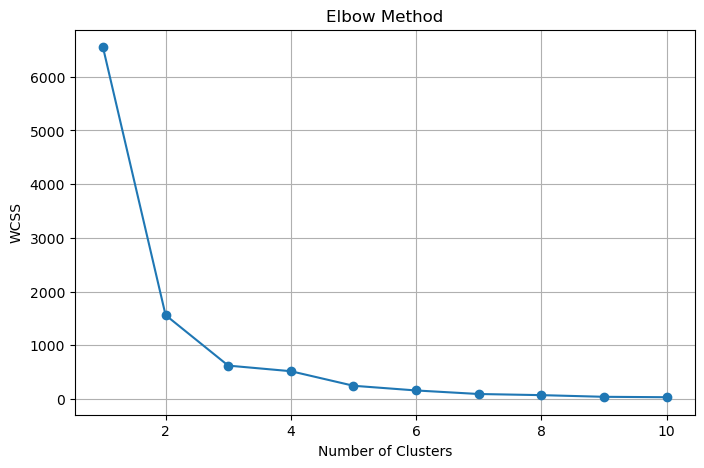

In [56]:
from sklearn.cluster import KMeans
wcss = [] #Within-Cluster Sum of Squares, to indicate how well the clusters will be generated
max_clusters = 10  # Maximum number of clusters to evaluate

# Compute WCSS for each number of clusters
for i in range(1, max_clusters + 1): #it will start in 1 and it will stop before 11
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(normalized_data)  # Using scaled data 
    wcss.append(kmeans.inertia_)  # Inertia = WCSS

plt.figure(figsize=(8, 5))
plt.plot(range(1, max_clusters + 1), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [57]:
#the best cluster amount is 3


kmeans = KMeans(n_clusters=3, random_state=42) # I will test creating 3 groups just to see where Ireland will stay.
labels = kmeans.fit_predict(normalized_data)

# cluster labels back to the dataset
pivoted_data_final['Cluster'] = labels

print_piv = pivoted_data_final.iloc[:,-3:]
print(print_piv)

Year                    2024-08-01 00:00:00  2024-09-01 00:00:00  Cluster
Country                                                                  
Albania                            0.650000             0.590000        0
Austria                           15.160000            17.473333        0
Belgium                           21.100000            20.910000        0
Bosnia and Herzegovina             0.760000             0.760000        0
Bulgaria                           0.400000             0.576667        0
Croatia                            3.620000             3.780000        0
Cyprus                             0.390000             0.490000        0
Czechia                            5.340000             5.720000        0
Denmark                            9.730000             9.880000        0
Estonia                            0.590000             0.650000        0
Finland                            7.140000             7.340000        0
France                           100.4

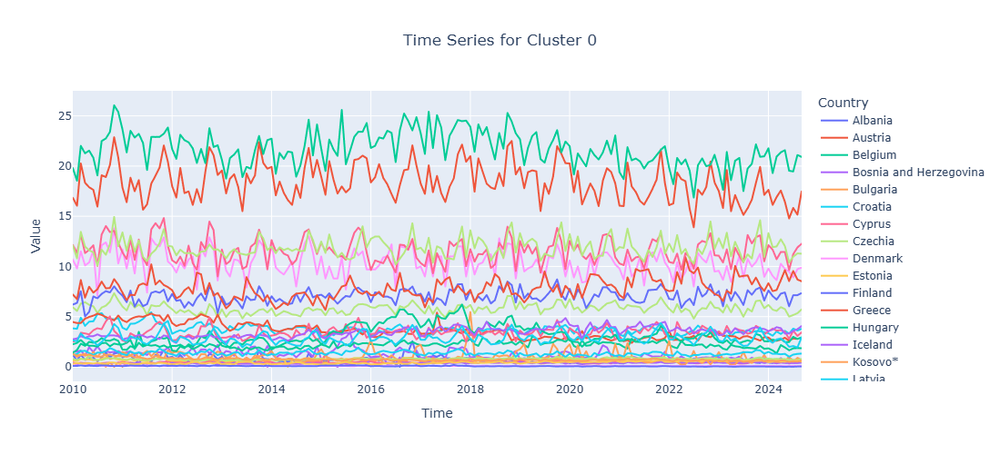

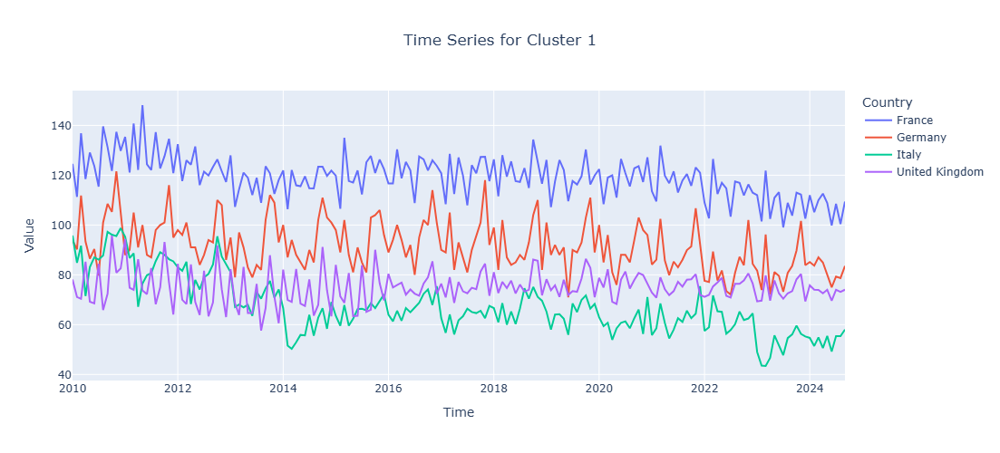

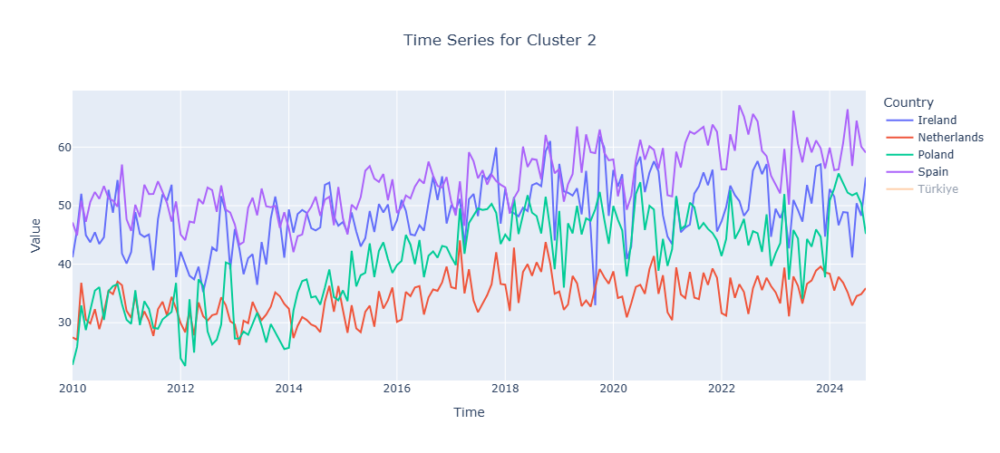

In [58]:
#Applying express plot layout

# Melt the data
melted_data = pivoted_data_final.reset_index().melt(
    id_vars=['Country', 'Cluster'], 
    var_name='Time', 
    value_name='Value'
)

for cluster_id in melted_data['Cluster'].unique():
    cluster_group = melted_data[melted_data['Cluster'] == cluster_id]
    fig = px.line(
        cluster_group, 
        x='Time', 
        y='Value', 
        color='Country',
        title=f'Time Series for Cluster {cluster_id}'
    )
    fig.update_layout(
        xaxis_title="Time", 
        yaxis_title="Value",
        legend_title="Country",
        title_x=0.5,  # Center the title
        width=1000,   # Set figure width
        height=500    # Set figure height
    )
    fig.show()


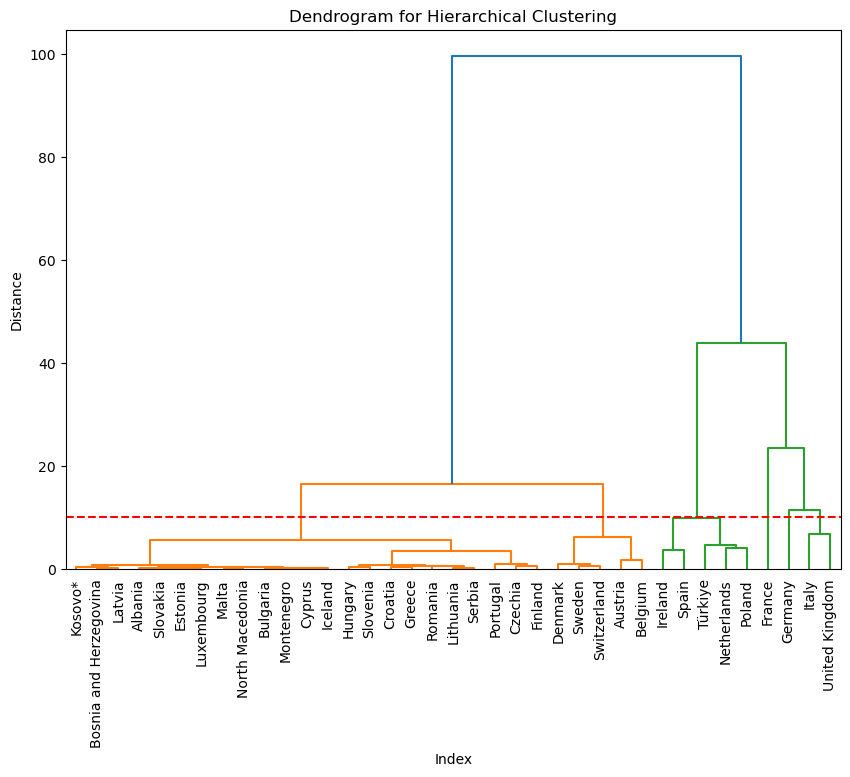

In [59]:
import scipy.cluster.hierarchy as sch #libary to work with hierarchy cluster
from scipy.cluster.hierarchy import linkage, dendrogram #plot dendrogram graph

#I will also test another method, hierarchical clustering

linkage_matrix = linkage(normalized_data, method='ward')  # 'ward' minimizes the variance of clusters
#,ethod single didnt work well
# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix, labels=pivoted_data_final.index, leaf_rotation=90, leaf_font_size=10)
plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Index')
plt.ylabel('Distance')
plt.axhline(y=10, color='r', linestyle='--')  # Optional: threshold line for cutting clusters
plt.show()


#Regarding Ireland. I got the same result in both

In [60]:
# I will create a group with countries closer to Ireland, so I can compare them later
# I did Kmean clustering before without applying any method to replace the missing value and Italy was in the Cluster 2
#very close to the Ireland as it is decreasing, but after applying imputation methods it changed
#both imnputation methods generated pretty much same results 

#countries = ['Ireland', 'Italy', 'Spain', 'Poland']

countries = ['Ireland', 'Spain', 'Poland']
df_new = df[df['Country'].isin(countries)]

In [61]:
df_new['Country'].value_counts()

Country
Ireland    177
Spain      176
Poland     176
Name: count, dtype: int64

In [62]:
df_new.tail()

,Country,Year,Value,ISO_Code,Year_Month
4836,Poland,2024-07-01,52.16,POL,2024-07
4837,Poland,2024-08-01,50.39,POL,2024-08
3198,Ireland,2024-08-01,48.27,IRL,2024-08
2138,Spain,2024-08-01,60.07,ESP,2024-08
3199,Ireland,2024-09-01,54.84,IRL,2024-09


In [63]:
#Only Ireland and Italy have info about September. I will delete them.
df_new = df_new[df_new['Year'] < '2024-09-01']

In [64]:
df_new['Country'].value_counts()

Country
Spain      176
Poland     176
Ireland    176
Name: count, dtype: int64

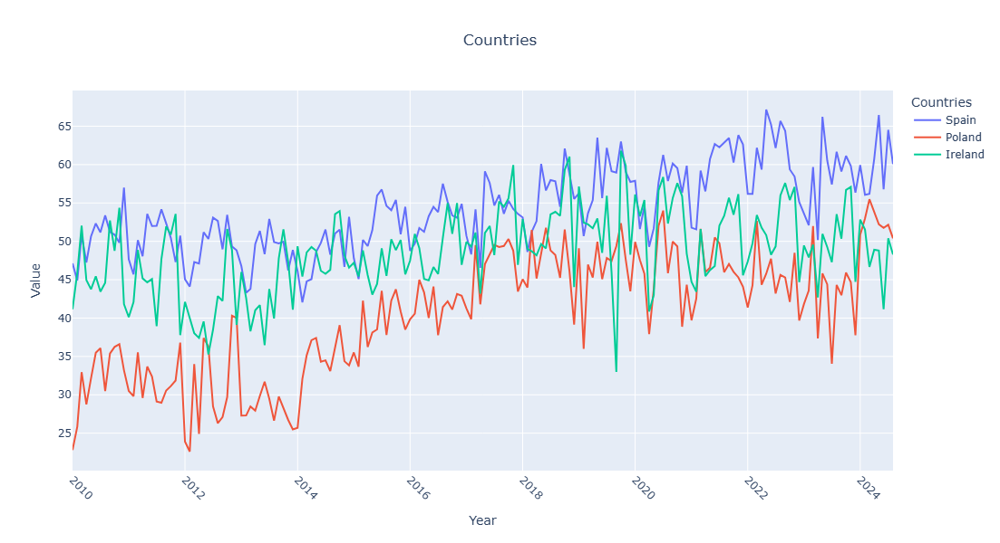

In [65]:
#create function to plot using express
def plot_simple(input):
    fig = px.line(
        input, 
        x='Year', 
        y='Value', 
        color='Country', 
        title='Countries'
    )
    fig.update_layout(
        xaxis_title="Year",
        yaxis_title="Value",
        legend_title="Countries",
        title_x=0.5,  
        width=1000,  
        height=600,  
        xaxis_tickangle=45 
    )
    fig.show()

plot_simple(df_new)

In [66]:
df_new.reset_index(drop=True, inplace=True)

In [67]:
df_new

,Country,Year,Value,ISO_Code,Year_Month
0,Spain,2010-01-01,47.14,ESP,2010-01
1,Poland,2010-01-01,22.81,POL,2010-01
2,Ireland,2010-01-01,41.16,IRL,2010-01
3,Spain,2010-02-01,44.90,ESP,2010-02
4,Ireland,2010-02-01,45.94,IRL,2010-02
...,...,...,...,...,...
523,Spain,2024-07-01,64.53,ESP,2024-07
524,Poland,2024-07-01,52.16,POL,2024-07
525,Poland,2024-08-01,50.39,POL,2024-08
526,Ireland,2024-08-01,48.27,IRL,2024-08


In [68]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 528 entries, 0 to 527
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Country     528 non-null    object        
 1   Year        528 non-null    datetime64[ns]
 2   Value       528 non-null    float64       
 3   ISO_Code    528 non-null    object        
 4   Year_Month  528 non-null    object        
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 20.8+ KB


In [69]:
df_new['Value'].describe()

count    528.000000
mean      47.770587
std        8.534965
min       22.600000
25%       43.457500
50%       48.820000
75%       53.370000
max       67.180000
Name: Value, dtype: float64

In [70]:
from sklearn.preprocessing import LabelEncoder #libary to lable in categories

le = LabelEncoder()
#Create label category for each country
df_new['Country_Encoded'] = le.fit_transform(df_new['Country'])

In [71]:
df_new

,Country,Year,Value,ISO_Code,Year_Month,Country_Encoded
0,Spain,2010-01-01,47.14,ESP,2010-01,2
1,Poland,2010-01-01,22.81,POL,2010-01,1
2,Ireland,2010-01-01,41.16,IRL,2010-01,0
3,Spain,2010-02-01,44.90,ESP,2010-02,2
4,Ireland,2010-02-01,45.94,IRL,2010-02,0
...,...,...,...,...,...,...
523,Spain,2024-07-01,64.53,ESP,2024-07,2
524,Poland,2024-07-01,52.16,POL,2024-07,1
525,Poland,2024-08-01,50.39,POL,2024-08,1
526,Ireland,2024-08-01,48.27,IRL,2024-08,0


In [72]:
df_ire = df_new[df_new['Country_Encoded'] == 0]
df_pol = df_new[df_new['Country_Encoded'] == 1]
df_spa = df_new[df_new['Country_Encoded'] == 2]
#df_ita = df_new[df_new['Country_Encoded'] == 3]



In [73]:
#I want to know each month is more productive along the years, in a hypotetical way to provide information about to government
def month_production(input,name):
    name = name
    df_ire_prod = input.copy()
    if df_ire_prod.index.name != 'Year':
       df_ire_prod.set_index('Year', inplace=True)

    df_ire_prod['Month_Change'] = df_ire_prod['Value'].diff()  #month-by-month change in the trend (Difference from previous value tothe future value) 
    df_ire_prod['Production_Increase'] = df_ire_prod['Month_Change'] > 0  # Boolean indicating increase #check if it is positive o
    df_ire_prod['Month'] = df_ire_prod.index.month_name()  # get month names to count and to use in graph
    df_ire_prod['Month_Number'] = df_ire_prod.index.month  # Extract month number to sort the graph by calendar order
    
    #Get only months with positive result
    increased_months = df_ire_prod[df_ire_prod['Production_Increase']]
    
    # count how many timess each month repeats
    month_increase_counts = increased_months['Month'].value_counts()
    
  
    month_increase_counts_df = month_increase_counts.reset_index() # copy it to a new table reseting index
    month_increase_counts_df.columns = ['Month', 'Increase_Count']
    
    # apply lambda function to use datetime in column month and extract the number of it
    month_increase_counts_df['Month_Number'] = month_increase_counts_df['Month'].apply(
        lambda month: pd.to_datetime(month, format='%B').month
    )
    
    # Sort by the month number
    month_increase_counts_df = month_increase_counts_df.sort_values('Month_Number')
    
    #bar chart
    plt.figure(figsize=(10, 6))
    plt.bar(month_increase_counts_df['Month'], month_increase_counts_df['Increase_Count'], color='skyblue', edgecolor='black')
    plt.title(f'{name}: Production Increases by Month (from 2010 until 2014)')
    plt.xlabel('Month')
    plt.ylabel('Number of Times Production Increased')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

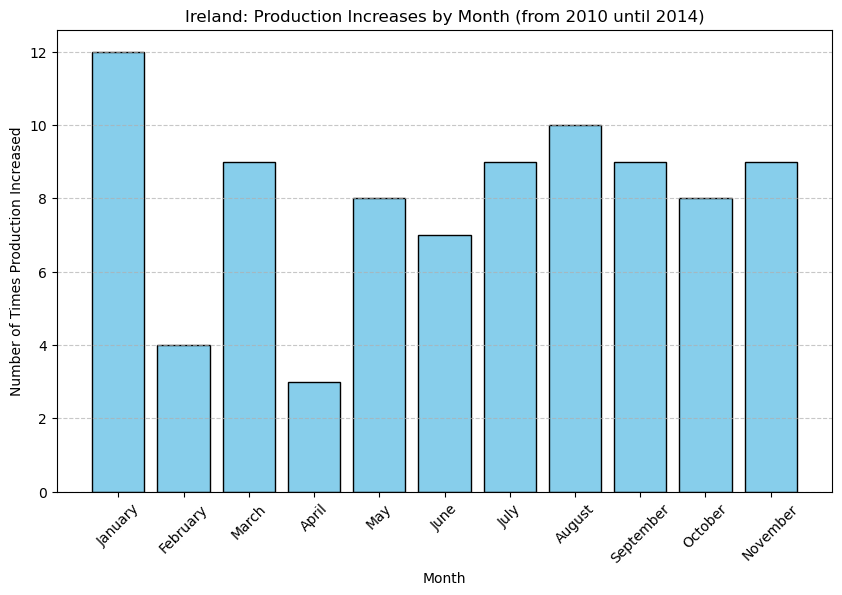

In [74]:
month_production(df_ire, 'Ireland')

In [75]:
#There was in month increasing production in December since 2015 for Ireland

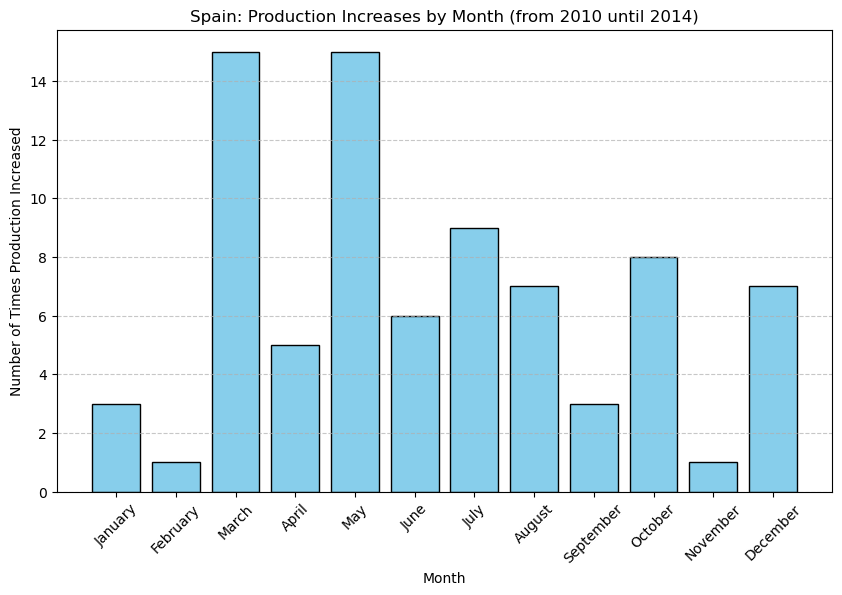

In [76]:
month_production(df_spa, 'Spain')

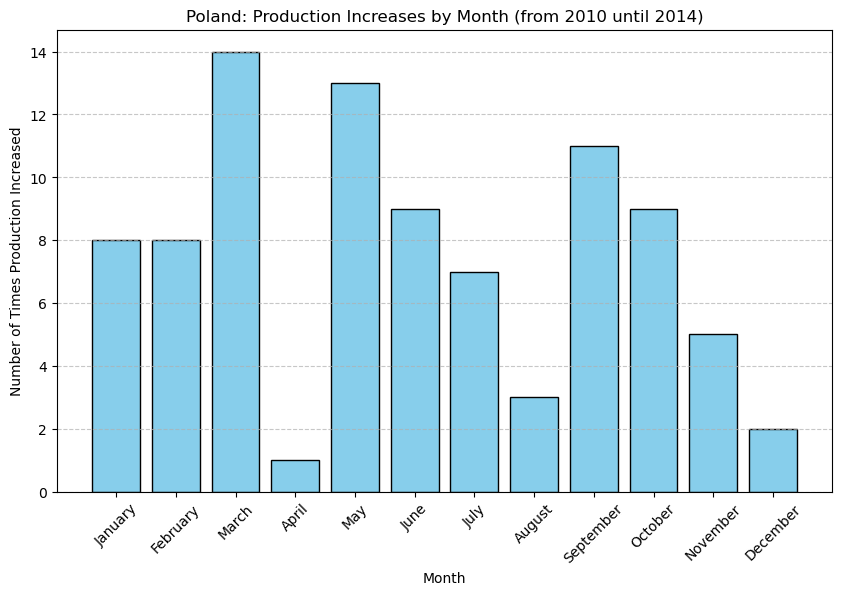

In [77]:
month_production(df_pol, 'Poland')

In [78]:
#April is not a good production month for any of the countries, maybe another country production affect all.

In [79]:
from scipy import stats
# Perform One-Way ANOVA
# to check how much the mean production (average value) of each country differs from 
#the overall mean production (mean of all the countries combined).

#null hypothesis: there is no significant production between the countries
#f_statistic, p_value = stats.f_oneway(df_ire['Value'], df_ita['Value'], df_pol['Value'],df_spa['Value'])

f_statistic, p_value = stats.f_oneway(df_ire['Value'], df_pol['Value'],df_spa['Value'])
print(f"F-statistic: {f_statistic}, P-value: {p_value}")

F-statistic: 199.8190440975034, P-value: 2.9800607209800043e-65


In [80]:
#F-sta is way high and P-Value is way lower than 0.05, this way we can reject null hypothesis
#one or more countries are significante different
#I will compare one by one

In [81]:
#by looking at the graphics I believe only Ireland and Spain are normally distributed
#I believe because Poland is increasing bovino production along the years

#countries = [df_ire, df_ita, df_spa, df_pol]  # List with all countries
countries = [df_ire, df_spa, df_pol]
#but I will confirm it also by another t-test
for country in countries:
    name = country['Country'].iloc[0]
    stat, p = stats.shapiro(country['Value'])
    print(f"{name}: Shapiro-Wilk Test Stat = {stat}, P-value = {p}")

Ireland: Shapiro-Wilk Test Stat = 0.9960432089046923, P-value = 0.9276530244339672
Spain: Shapiro-Wilk Test Stat = 0.9872544111909036, P-value = 0.11210299073776991
Poland: Shapiro-Wilk Test Stat = 0.9658036840325067, P-value = 0.00025881538951317895


In [82]:
#Poland have p-values < 0.05 so they are not normal distributed
#but how we are working with Time series, the mochine learning models do NOT require the data to be normal distributed

In [83]:
#T-Test to compare one country to another 
def t_test(country1,country2):
    # Perform T-test between Ireland and Italy
    t_stat, p_value = stats.ttest_ind(country1['Value'], country2['Value'])
    name1 = country1['Country'].iloc[0]
    name2 = country2['Country'].iloc[0]
    print(f"{name1} VS {name2} T-statistic: {t_stat}, P-value: {p_value}")


t_test(df_ire,df_spa)

Ireland VS Spain T-statistic: -9.588156401204602, P-value: 1.7399542435135205e-19


In [84]:
#F-sta is way high and P-Value is way lower than 0.05, this way we can reject null hypothesis

In [85]:
from itertools import combinations # libary to generate combination of groups to run the t-test

# Function to perform t-test between two countries
def t_test(country1, country2):
    # Perform T-test between two countries
    t_stat, p_value = stats.ttest_ind(country1['Value'], country2['Value'])
    name1 = country1['Country'].iloc[0]
    name2 = country2['Country'].iloc[0]
    print(f"{name1} VS {name2} T-statistic: {t_stat}, P-value: {p_value}")

# Loop through all pairs of countries and perform t-test
for country1, country2 in combinations(countries, 2):
    t_test(country1, country2)

Ireland VS Spain T-statistic: -9.588156401204602, P-value: 1.7399542435135205e-19
Ireland VS Poland T-statistic: 10.973208681058493, P-value: 2.820242168066589e-24
Spain VS Poland T-statistic: 18.67505906733928, P-value: 1.7139769615231374e-54


In [86]:
#null hypothesis: there is no significant production between the countries
#unfortunatly they are reject null hypothesis for all of them even being in the same group creating by the clustering
#but less significant is Spain, so I will compare these 2 countries in Mann-Whitney U

# I will test Mann-Whitney U between Ireland and Spain
#It's non-parametric, so it doesn't requires normal distribution necessarily
#It will check if they have same distribution, no significant difference in the pattern of their values
u_stat, p_value = stats.mannwhitneyu(df_ire['Value'], df_spa['Value'])

print(f"U-statistic: {u_stat}, P-value: {p_value}")

U-statistic: 7505.0, P-value: 6.145840331141305e-17


In [87]:
#the P-value for U is way lower than 0.05, which means their patterns of production differ significantly

In [88]:
countries = [df_ire, df_spa,df_pol] 

#Chi-squared test between them
#the null hypothesis states that there is no association between them
#the distribution of one country doesnt depend of the other 
# Combine the 'Value' columns from both countries into one list
values = [df['Value'].values for df in countries]

# You need to reshape your data for the chi-squared test. 
# The test requires a 2D array where each column is a different country.

#Chi-squared test
chi2_stat, p_value, dof, expected = stats.chi2_contingency(values)

#results
print(f"Chi2-statistic: {chi2_stat}, P-value: {p_value}")
print(f"Degrees of Freedom: {dof}")
print(f"Expected Frequencies: {expected}")

#This is the result for all the 4 countries together
#Chi2-statistic: 626.9017272306054, P-value: 0.0014324297175801568

Chi2-statistic: 159.36287072387887, P-value: 1.0
Degrees of Freedom: 350
Expected Frequencies: [[37.66367807 39.55855666 46.04656672 40.99920675 42.89069558 45.16861761
  44.30422755 43.54830997 47.22620492 46.06351555 47.72450036 44.75506629
  40.09074975 39.85346621 45.61267681 41.63309279 44.71777887 43.87711717
  40.70768697 44.3482945  45.70759023 44.89404665 44.98896007 42.48053402
  37.65011901 36.1145555  40.4432853  37.08741803 43.43644773 41.31106512
  40.70768697 41.2941163  40.10091905 45.68725164 46.95163396 43.37543196
  40.70768697 38.37891847 37.47385123 40.20261199 41.66360068 39.49415113
  42.78561287 39.48398183 43.15509724 44.00592824 40.76192321 39.14500534
  41.07039182 40.5212499  43.5550895  44.56184969 45.68725164 44.16185743
  44.67710169 43.27034925 47.643146   48.99905197 43.79576281 45.29064915
  44.24999131 42.09071106 47.89059884 44.47032603 44.95845218 47.09400408
  50.63630843 46.75163783 49.69395378 50.16513111 48.12110286 47.01942926
  46.13131085 47.

In [89]:
#The p-value is 1.0, way bigger than 0.05
#it fails to reject the null hypothesis, There is no association between them
#They are independent of each other

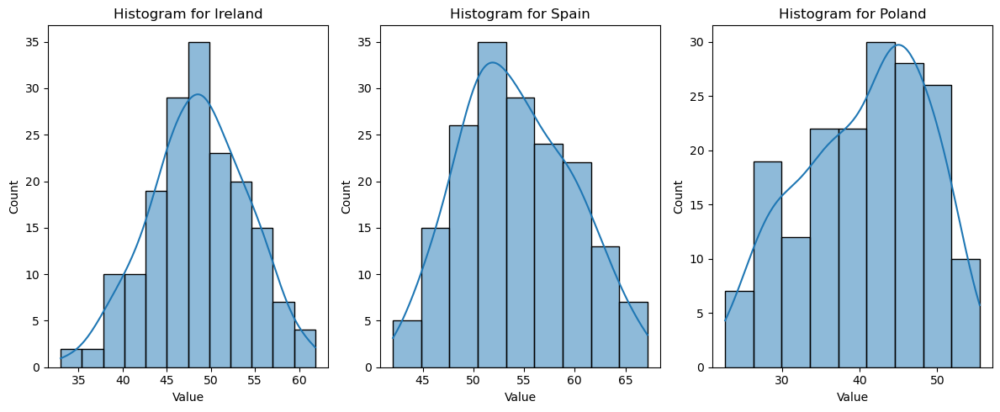

In [90]:
#I will check if they are normal distributed

#countries = [df_ire, df_ita, df_spa, df_pol]  # List with all countries
countries = [df_ire, df_spa, df_pol]
# making the graph 2 by 2 
fig, axes = plt.subplots(1, 3, figsize=(12, 5))
axes = axes.flatten()  # Flatten to fit it better

#histograms for each country
for i, country in enumerate(countries):
    name = country['Country'].iloc[0]
    sns.histplot(country['Value'], kde=True, ax=axes[i])  # each plot to sns
    axes[i].set_title(f"Histogram for {name}")

# the lyout to fit proper
plt.tight_layout()
plt.show()

In [91]:
#I will work on prediction for Ireland, then Spain
#I will test with SARIMAX, due it was created for time series data

df_ire.set_index('Year', inplace=True)  # turn year as index so it will be automaticaly being using as X
df_ire.index.freq = 'MS'  # Replace 'MS' with the appropriate frequency

df_spa.set_index('Year', inplace=True)
df_spa.index.freq = 'MS'  # Replace 'MS' with the appropriate frequency
df_pol.set_index('Year', inplace=True)
df_pol.index.freq = 'MS'  # Replace 'MS' with the appropriate frequency

In [92]:
df_ire = df_ire.drop(['Country','ISO_Code','Year_Month','Country_Encoded'], axis=1)
df_spa = df_spa.drop(['Country','ISO_Code','Year_Month','Country_Encoded'], axis=1)
df_pol = df_pol.drop(['Country','ISO_Code','Year_Month','Country_Encoded'], axis=1)

In [93]:
df_ire.describe()

,Value
count,176.000000
mean,48.579318
std,5.513118
min,32.970000
25%,45.102500
50%,48.795000
75%,52.350000
max,61.820000


In [94]:
from scipy.stats import t
#I will analyzing the overall production levels for Ireland

def confidence(input):
    print('Full description')
    input.describe()
    desc = input.describe()
    print(desc)
    # Extract individual values
    count = desc.loc['count']
    mean = desc.loc['mean']
    std = desc.loc['std']
    print(count)
    # Dataset statistics
    mean_x = mean
    std_dev = std
    n = count
    
    # 95% Confidente interval
    t_value = t.ppf(0.975, df=n-1)  # 95% confidence level
    se = std_dev / np.sqrt(n)       # Standard error
    lower_ci = mean_x - t_value * se
    upper_ci = mean_x + t_value * se
    print('---------------------------------------------------------')
    print(f"95% Confidence Interval for Mean Production are: Lower {lower_ci} and Upper {upper_ci}")

In [95]:
confidence(df_ire)

Full description
            Value
count  176.000000
mean    48.579318
std      5.513118
min     32.970000
25%     45.102500
50%     48.795000
75%     52.350000
max     61.820000
Value    176.0
Name: count, dtype: float64
---------------------------------------------------------
95% Confidence Interval for Mean Production are: Lower Value    47.75915
dtype: float64 and Upper Value    49.399486
dtype: float64


In [96]:
#The true average populationis estimated to be between 47.76 and 49.40 tons

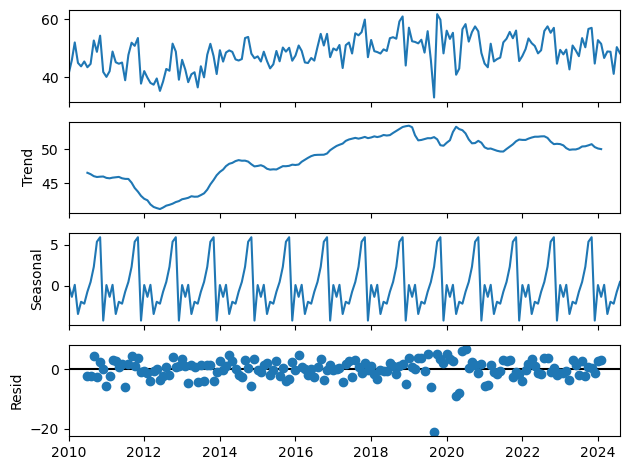

In [97]:
import statsmodels.api as sm
#I will plot the statmodel to confirm the CI above
res = sm.tsa.seasonal_decompose(df_ire,period=12,model='additive').plot() #using additive model cause the data is not increasing by time constantly
plt.show()

In [ ]:
#we can see in the top graphic the data goes aroung 48

In [98]:
confidence(df_spa)

Full description
            Value
count  176.000000
mean    54.196080
std      5.477444
min     42.060000
25%     50.177500
50%     53.620000
75%     58.097500
max     67.180000
Value    176.0
Name: count, dtype: float64
---------------------------------------------------------
95% Confidence Interval for Mean Production are: Lower Value    53.381219
dtype: float64 and Upper Value    55.010941
dtype: float64


In [99]:
#I Will work with Samirax as it is a model created for time series 
#I will check if the data is stationary as it requires by Samirax

def rolling_stat(input):
    rolling_mean = input.rolling(window=12).mean()
    rolling_std = input.rolling(window=12).std()
    
    plt.figure(figsize=(10, 6))
    plt.plot(input, label='Original')
    plt.plot(rolling_mean, label='Rolling Mean', color='red')
    plt.plot(rolling_std, label='Rolling Std', color='black')
    plt.legend()
    plt.show()

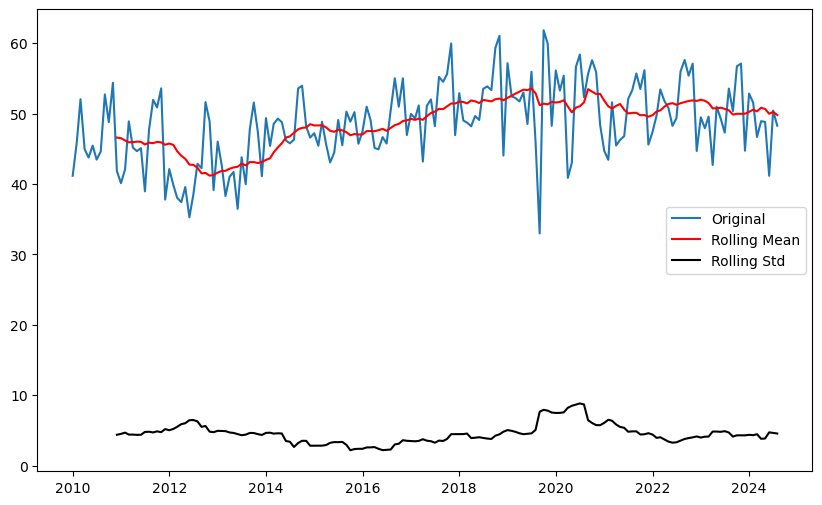

In [100]:
rolling_stat(df_ire)

In [101]:
# the Std line is way far from the values so we are not rejecting the Null Hypothesis, 
#in another words the data is non-stationary

# I will try another adf method
# Null Hypothesis: data is non-stationary

# critical value 5% > ADF Statistics
# p-value < 0.05

In [102]:
#As the standard deviantion are very low the data is no stationary
# but I will also check it using p-value, just to practice different method

from statsmodels.tsa.stattools import adfuller

def adf_test(input):
    result = adfuller(input)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Number of Observation used:', result[3])
    for key, value in result[4].items():
        print('Critical Value {}: {}'.format(key, value))

In [103]:
adf_test(df_ire)

ADF Statistic: -1.4739219717192504
p-value: 0.5463700755837093
Number of Observation used: 161
Critical Value 1%: -3.471633386932248
Critical Value 5%: -2.8796651107461972
Critical Value 10%: -2.576433647235832


In [104]:
if(-2.8796651107461972 > -1.4739219717192504):
    print('True')
else:
    print('False')

if(0.5463700755837093 < 0.05):
    print('True')
else:
    print('False')

False
False


In [105]:
#Applying difference to turn the data stationary
#it calculates the difference from the previous value to the next one
#Production: [100, 105, 102, 108]
#Diff:       [ NaN,  5,  -3,   6]
df_ire_dff = df_ire.diff().dropna()
df_ire_dff

,Value
Year,
2010-02-01,4.78
2010-03-01,6.09
2010-04-01,-7.08
2010-05-01,-1.20
2010-06-01,1.69
...,...
2024-04-01,2.25
2024-05-01,-0.10
2024-06-01,-7.65


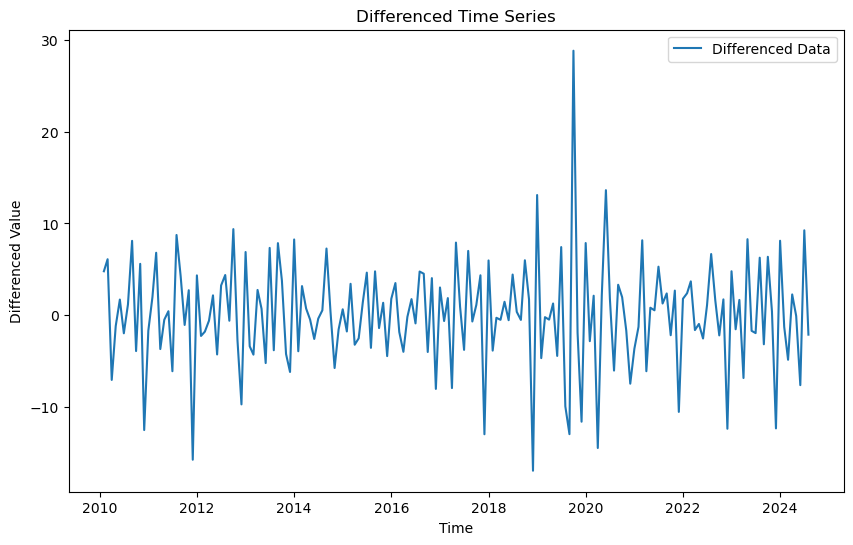

In [106]:
plt.figure(figsize=(10, 6))
plt.plot(df_ire_dff, label='Differenced Data')
plt.title('Differenced Time Series')
plt.xlabel('Time')
plt.ylabel('Differenced Value')
plt.legend()
plt.show()

In [107]:
df_ire_dff.head()

,Value
Year,
2010-02-01,4.78
2010-03-01,6.09
2010-04-01,-7.08
2010-05-01,-1.20
2010-06-01,1.69


In [108]:
confidence(df_ire_dff)

Full description
            Value
count  175.000000
mean     0.040629
std      5.856859
min    -16.990000
25%     -3.020000
50%      0.350000
75%      3.360000
max     28.850000
Value    175.0
Name: count, dtype: float64
---------------------------------------------------------
95% Confidence Interval for Mean Production are: Lower Value   -0.833198
dtype: float64 and Upper Value    0.914455
dtype: float64


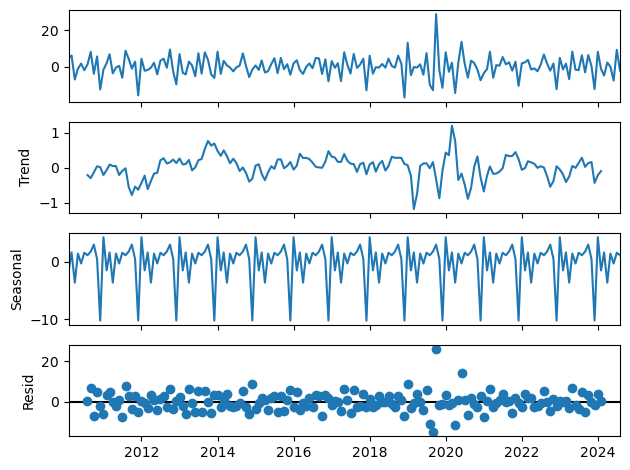

In [109]:
res = sm.tsa.seasonal_decompose(df_ire_dff,period=12,model='additive').plot() # using additive model cause the data is not increasing by time constantly
plt.show()

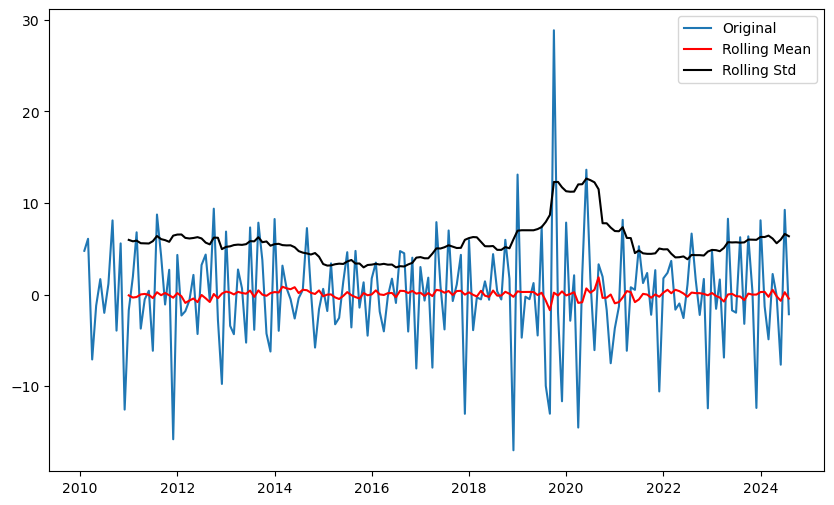

In [110]:
rolling_stat(df_ire_dff['Value'])

In [111]:
# the data is now stationary I will double check with p-value

In [112]:
adf_test(df_ire_dff['Value'])

ADF Statistic: -5.074020786332806
p-value: 1.5807018510073455e-05
Number of Observation used: 160
Critical Value 1%: -3.4718957209472654
Critical Value 5%: -2.8797795410156253
Critical Value 10%: -2.5764947265625


In [113]:
# Null Hypothesis: data is non-stationary

# critical value 5% > ADF Statistics
# p-value < 0.05

if(-2.8906107514600103 > -5.074020786332806):
    print('True')
else:
    print('False')

if(1.5807018510073455e-05 < 0.05):
    print('True')
else:
    print('False')

True
True


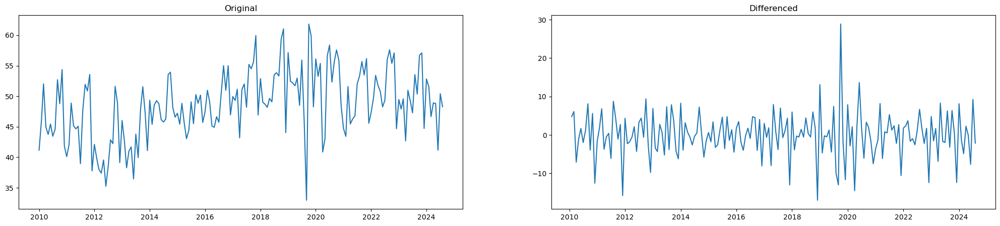

In [114]:
fig, axes = plt.subplots(1,2,figsize=(25,5))

#plotting original vs diff
axes[0].plot(df_ire);axes[0].set_title('Original')
axes[1].plot(df_ire_dff);axes[1].set_title('Differenced')
plt.show()

In [115]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf #create plots to get the best parameter results to be 
#used in SARIMAX

In [116]:
df_ire_dff

,Value
Year,
2010-02-01,4.78
2010-03-01,6.09
2010-04-01,-7.08
2010-05-01,-1.20
2010-06-01,1.69
...,...
2024-04-01,2.25
2024-05-01,-0.10
2024-06-01,-7.65


In [117]:
#Split de difference data to find SARIMAX best elements
train_data = '2022-01-01'
test_data = '2022-02-01'
train_dff = df_ire_dff.loc[:train_data]
test_dff = df_ire_dff.loc[test_data:]
#Split Original dataset to compare with the predicition made with difference data
train = df_ire.loc[:train_data]
test = df_ire.loc[test_data:]

In [118]:
train_dff.shape

(144, 1)

In [119]:
test_dff.shape

(31, 1)

In [120]:
#ARIMA
#Lets find the best measurement for our prediction (p,q and d)

#d id the number of times we did the difference so the data would de stationary. Our d is 1

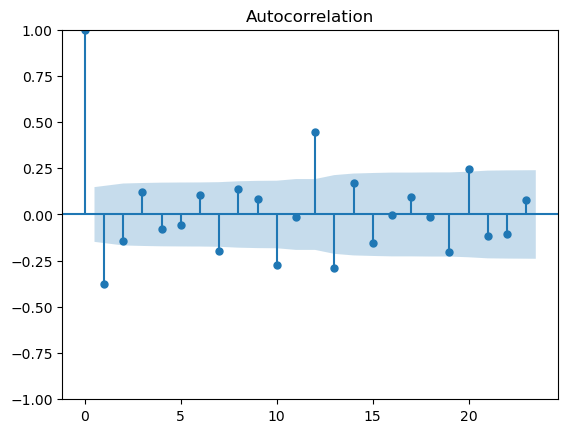

In [121]:
plot_acf(df_ire_dff)
plt.show()

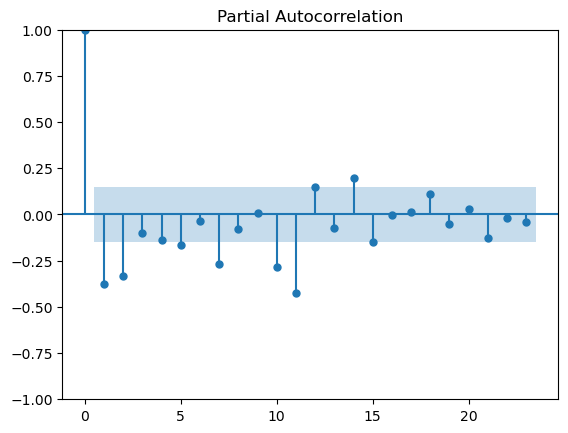

In [122]:
#to find q in ACF we need to find the first one that is close to the edge of the confidence area and go back one
#from the above ACF graph the lag is 2 so our q is 1
plot_pacf(df_ire_dff)
plt.show()
#to find p in PACF we need to find the first one that is close to the edge of the confidence area 

In [123]:
#in this case it is the number 4, so we go back one
# our p is 3

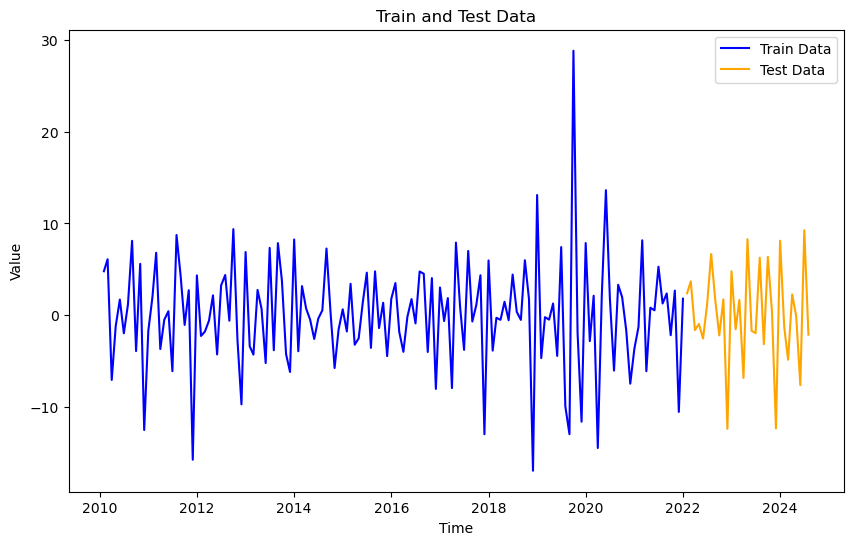

In [124]:
def split_time(a,b):
    plt.figure(figsize=(10, 6))
    plt.plot(a.index, a['Value'], label='Train Data', color='blue')
    plt.plot(b.index, b['Value'], label='Test Data', color='orange')
    #plt.axvline(x=train.index[-1], color='gray', linestyle='--', label='Train-Test Split')  # Mark the split
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title('Train and Test Data')
    plt.legend()
    plt.show()

split_time(train_dff,test_dff)

In [125]:
from statsmodels.tsa.statespace.sarimax import SARIMAX #Sarimax libary
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score #calculate accurancy of the prediction

In [126]:
train_dff

,Value
Year,
2010-02-01,4.78
2010-03-01,6.09
2010-04-01,-7.08
2010-05-01,-1.20
2010-06-01,1.69
...,...
2021-09-01,2.36
2021-10-01,-2.20
2021-11-01,2.67


In [127]:
#I have tested difference valeus to create predictions with no good result
# I will test with auto_arima to provide the best valeus automatically, and I will try another prediction
from pmdarima import auto_arima
# 

# auto_model = auto_arima(y=train_dff, 
#                    start_p=0, max_p=12, 
#                    start_q=0, max_q=12, 
#                    d=1,  # Diferenciação já aplicada
#                    seasonal=False,  # Defina como True se houver sazonalidade
#                    stepwise=False)
# print(auto_model.summary())

In [128]:
#Arime order=(q,d,p)

#arima = sm.tsa.arima.ARIMA(train, order=(1,1,3))
# arima = sm.tsa.arima.ARIMA(train_dff, order=(6,1,1))
# model = arima.fit()
# model.summary()

In [129]:
# Fit auto_arima to your training data

def sarimax(input):
    auto_model = auto_arima(
        input, 
        seasonal=True,           # Enable seasonal model
        m=12,                    # Seasonal period (e.g., 12 for monthly data)
        stepwise=True,           # Perform stepwise search to reduce computation
        suppress_warnings=True,  # Suppress convergence warnings
        error_action='ignore',   # Ignore if a model fails
        max_p=7, max_q=7,        # Maximum p and q values
        max_P=7, max_Q=7,        # Maximum seasonal P and Q
        max_order=None,          # Maximum order (sum of p, q, P, Q)
        trace=True               # Print the progress
    )

    # Print the best parameters
    print(auto_model.summary())

sarimax(train_dff)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.06 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=926.069, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=874.560, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=847.324, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=924.077, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=877.176, Time=0.09 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=842.585, Time=1.56 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=844.502, Time=0.26 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.83 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.85 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=848.391, Time=0.69 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=846.456, Time=0.58 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=inf, Time=3.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=895.530, Time=0.27 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, T

In [130]:
# Extract parameters from auto_arima
#best_order = auto_model.order  # (p, d, q)
#est_seasonal_order = auto_model.seasonal_order  # (P, D, Q, s)

# Fit SARIMAX model
#I tried using the results I believe it is correct from the ACF and PACF, but I get 0,01% better in mae using the parameters from auto-arima
#sarimax_model = SARIMAX(train_dff, order=(1, 0, 3), seasonal_order=(2, 0, 2, 12))
sarimax_model = SARIMAX(train_dff, order=(1, 0, 2), seasonal_order=(2, 0, 2, 12)) #from auto-arima
Smodel = sarimax_model.fit()

# Print summary
print(Smodel.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              Value   No. Observations:                  144
Model:             SARIMAX(1, 0, 2)x(2, 0, 2, 12)   Log Likelihood                -405.575
Date:                            Sat, 21 Dec 2024   AIC                            827.150
Time:                                    23:55:06   BIC                            850.908
Sample:                                02-01-2010   HQIC                           836.804
                                     - 01-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5816      0.186     -3.130      0.002      -0.946      -0.217
ma.L1         -0.0716      0.160   

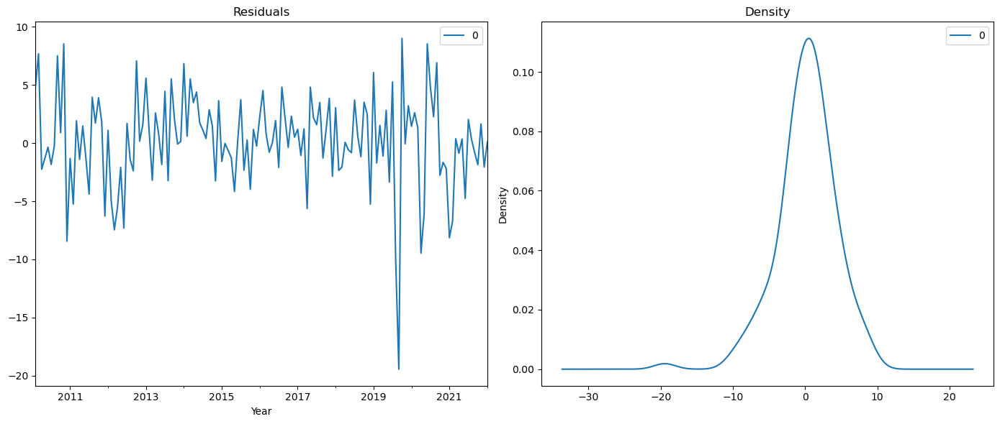

In [131]:
#residual errors
def residual(input):
    residual = pd.DataFrame(input.resid)
    fig, ax = plt.subplots(1,2, figsize=(14, 6)) #1 line 2 columns
    residual.plot(title='Residuals',ax=ax[0])
    residual.plot(kind='kde',title='Density', ax=ax[1])
    plt.tight_layout()  # better space between them
    plt.show()

residual(Smodel)

In [132]:
#all the residuals shows around 0 and the Distribution shows also around 0, so mean and variance is constant ( bell curve)

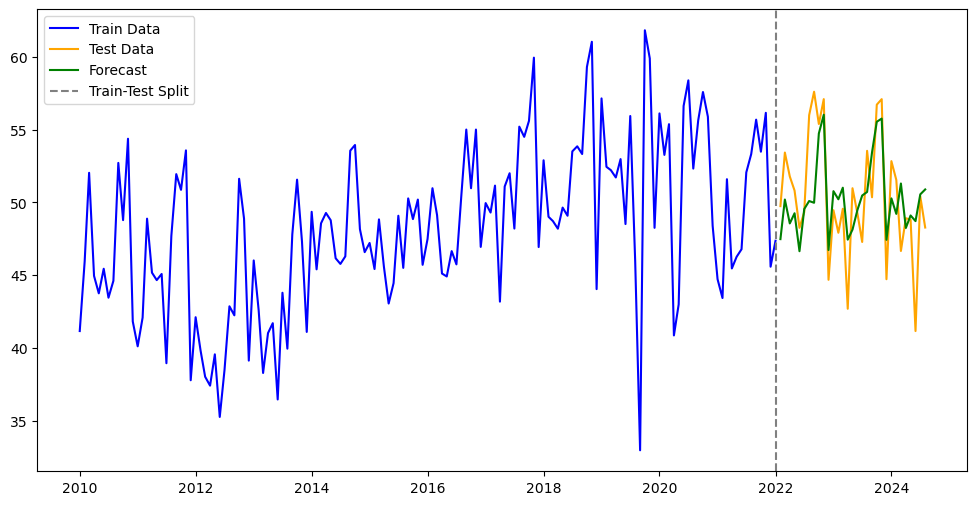

In [133]:
# Obtain the predicted differenced values
forecast_diff = Smodel.get_forecast(steps=len(test))
forecast_mean = forecast_diff.predicted_mean
    
# Add the last known value to forecasted differences to get the final forecast
#forecast_original = forecast_mean + train_dff['Value'].iloc[-1]
forecast_original = forecast_mean.cumsum() + train['Value'].iloc[-1]
def forecast(a,b,c):
    plt.figure(figsize=(12, 6))
    plt.plot(b.index, b['Value'], label='Train Data', color='blue')
    plt.plot(c.index, c['Value'], label='Test Data', color='orange')
    plt.plot(a.index, a, label='Forecast', color='green')
    plt.axvline(x=b.index[-1], color='gray', linestyle='--', label='Train-Test Split')
    plt.legend()
    plt.show()


forecast(forecast_original,train,test)

In [134]:
# Calculate performance metrics
mae = mean_absolute_error(test, forecast_original)
mse = mean_squared_error(test, forecast_original)
r2 = r2_score(test, forecast_original)

print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"R² Score: {r2}")

Mean Absolute Error: 2.4957261230073824
Mean Squared Error: 9.856990476905553
R² Score: 0.4167731522402941


I have tried different values in ARIMA and SARIMAX and the result above was the best one I could get.
With mean equal to 50.39
this corresponds to an average error of 4.96% (MAE 2.5 / 50.39 × 100).
I believe it is a good prediction

In [136]:
test.describe()

,Value
count,31.000000
mean,50.393226
std,4.179012
min,41.160000
25%,48.260000
50%,49.740000
75%,53.125000
max,57.600000


In [137]:
#Based on the residual I believe it is not overfitting, but I will try again using less data just to see 
#if I get a better prediction

In [138]:
df_ire_dff

,Value
Year,
2010-02-01,4.78
2010-03-01,6.09
2010-04-01,-7.08
2010-05-01,-1.20
2010-06-01,1.69
...,...
2024-04-01,2.25
2024-05-01,-0.10
2024-06-01,-7.65


In [139]:
df_ire_dff2 = df_ire_dff[df_ire_dff.index > '2016-04-01']
df_ire_2 = df_ire[df_ire.index > '2016-04-01']

In [140]:
df_ire_dff2

,Value
Year,
2016-05-01,-0.20
2016-06-01,1.74
2016-07-01,-0.91
2016-08-01,4.75
2016-09-01,4.51
...,...
2024-04-01,2.25
2024-05-01,-0.10
2024-06-01,-7.65


In [141]:
df_ire_2

,Value
Year,
2016-05-01,44.91
2016-06-01,46.65
2016-07-01,45.74
2016-08-01,50.49
2016-09-01,55.00
...,...
2024-04-01,48.91
2024-05-01,48.81
2024-06-01,41.16


In [142]:
adf_test(df_ire_dff2['Value'])

ADF Statistic: -5.699941042042499
p-value: 7.717454036637868e-07
Number of Observation used: 87
Critical Value 1%: -3.5078527246648834
Critical Value 5%: -2.895382030636155
Critical Value 10%: -2.584823877658872


In [143]:
if(-2.895382030636155 > -5.699941042042499):
    print('True')
else:
    print('False')

if(7.717454036637868e-07 < 0.05):
    print('True')
else:
    print('False')# it is stationary 

True
True


In [144]:
train_data2 = '2022-12-01'
test_data2 = '2023-01-01'
train_dff2 = df_ire_dff2.loc[:train_data2]
test_dff2 = df_ire_dff2.loc[test_data2:]
train2 = df_ire_2.loc[:train_data2]
test2 = df_ire_2.loc[test_data2:]

In [145]:
train_dff2.shape

(80, 1)

In [146]:
test_dff2.shape

(20, 1)

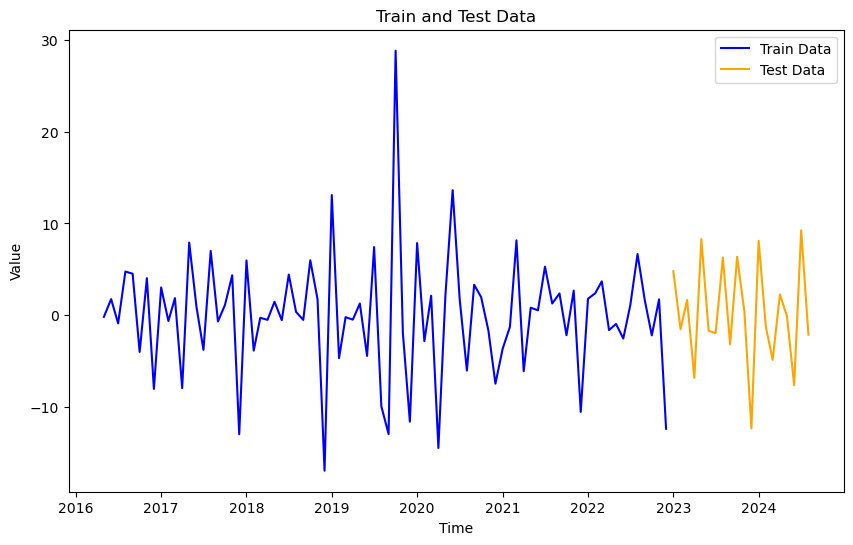

In [147]:
split_time(train_dff2,test_dff2)

In [148]:
#I will use auto-arima to get the best parameter
sarimax(train_dff2)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=534.636, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=512.670, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=532.636, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=525.528, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=514.629, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=514.620, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=514.201, Time=0.18 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=516.607, Time=0.86 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=520.804, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=500.837, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=514.713, Time=0.08 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=502.615, Time=0.61 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AI

In [149]:
#sarimax_model2 = SARIMAX(train_dff2, order=(4, 0, 0), seasonal_order=(1, 0, 1, 12))
sarimax_model2 = SARIMAX(train_dff2, order=(2, 0, 0), seasonal_order=(1, 0, 0, 12))
Smodel2 = sarimax_model2.fit()

# Print summary
print(Smodel2.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              Value   No. Observations:                   80
Model:             SARIMAX(2, 0, 0)x(1, 0, 0, 12)   Log Likelihood                -245.427
Date:                            Sat, 21 Dec 2024   AIC                            498.854
Time:                                    23:55:30   BIC                            508.383
Sample:                                05-01-2016   HQIC                           502.674
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4868      0.077     -6.360      0.000      -0.637      -0.337
ar.L2         -0.3993      0.098   

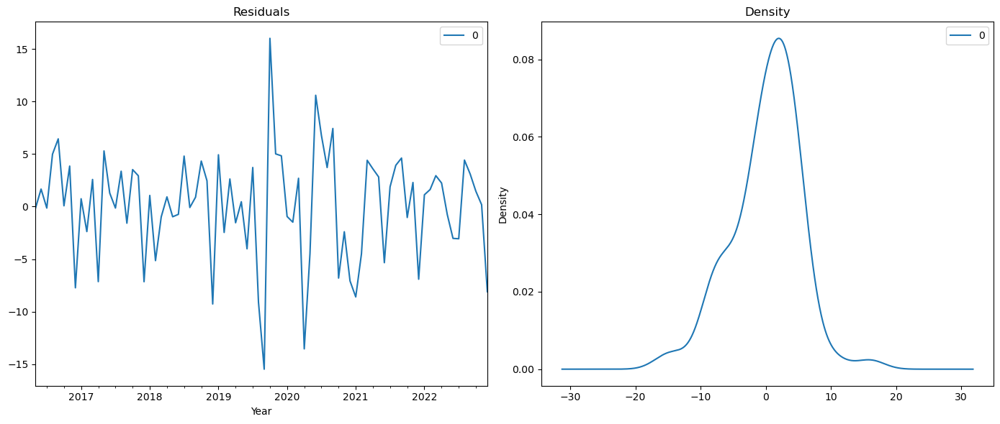

In [150]:
residual(Smodel2)

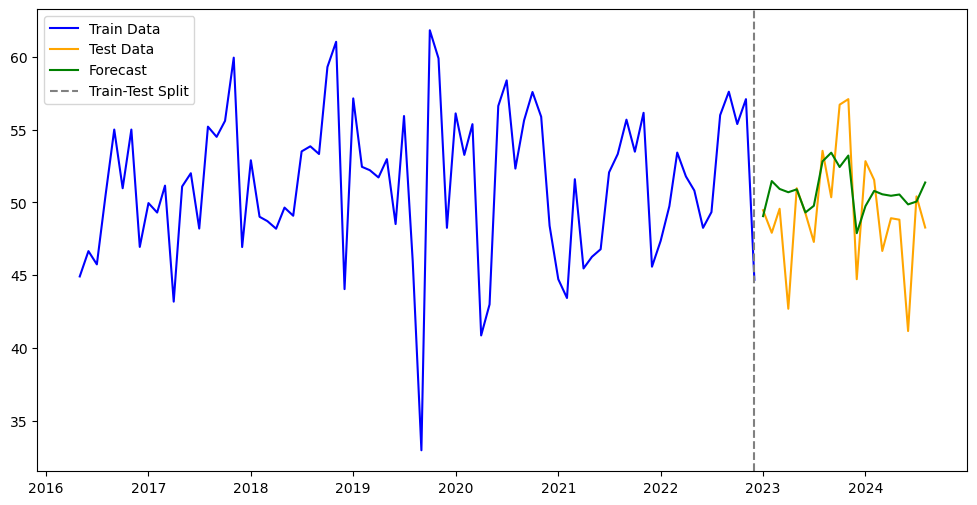

In [151]:
# Obtain the predicted differenced values
forecast_diff2 = Smodel2.get_forecast(steps=len(test_dff2))
forecast_mean2 = forecast_diff2.predicted_mean
    
# Add the last known value to forecasted differences to get the final forecast
#forecast_original2 = forecast_mean2 + train2['Value'].iloc[-1]
forecast_original2 =  forecast_mean2.cumsum() + train2['Value'].iloc[-1]
forecast(forecast_original2,train2,test2)

In [152]:
# Calculate performance metrics
mae = mean_absolute_error(test2, forecast_original2)
mse = mean_squared_error(test2, forecast_original2)
r2 = r2_score(test2, forecast_original2)

print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"R² Score: {r2}")
    

#Previous result MAE: 2.4957261230073824, MSE: 9.856990476905553, R2: 0.4167731522402941

Mean Absolute Error: 2.71040423403886
Mean Squared Error: 12.70985401689967
R² Score: 0.15662922148752523


In [153]:
#There is no such big difference between fulldata vs lessdata
#but with fulldata the result was better

#I will apply GridSearhCV and hyper parameters to find the best method for other prediction models
#I will use models that dont requires stationary data so I will use original data

In [154]:
df_ire

,Value
Year,
2010-01-01,41.16
2010-02-01,45.94
2010-03-01,52.03
2010-04-01,44.95
2010-05-01,43.75
...,...
2024-04-01,48.91
2024-05-01,48.81
2024-06-01,41.16


In [381]:
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV #libary to split timeseries  correctly and not in random way.#GridSearch to test 
#different models and parameters 
from sklearn.metrics import accuracy_score, classification_report # to calculate the best one 
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

df_ire_Grid = df_ire.reset_index()

#In time series there future value depends on the past value
#In Time dependency machine learning we need to turn it in supervised model 
#where each row corresponds to an observation and columns represent features
#we do it by creating lags


def create_lag_features(data, n_lags):
    lagged_data = data.copy()
    for lag in range(1, n_lags + 1):
        lagged_data[f'lag_{lag}'] = lagged_data['Value'].shift(lag)
    return lagged_data.dropna()

# Apply the function to create lagged features and return it to the variable
df_lagged = create_lag_features(df_ire_Grid, n_lags=12)

X = df_lagged.drop(columns=['Value','Year'])  # Lagged features
y = df_lagged['Value']  # Target variable

#split
#X = df_ire_Grid[['Year']]
#y = df_ire_Grid['Value']  # Target variable

datetime_cols = X.select_dtypes(include=['datetime64']).columns

    # Convert datetime columns into numerical features, cause some model dont accept data as string
# for col in datetime_cols:
#         X[f"{col}_year"] = X[col].dt.year
#         X[f"{col}_month"] = X[col].dt.month

    # Drop original datetime columns
X = X.drop(columns=datetime_cols)

In [383]:
X

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
12,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94,41.16
13,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94
14,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03
15,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95
16,45.17,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75
...,...,...,...,...,...,...,...,...,...,...,...,...
171,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97,42.69
172,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97
173,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25
174,41.16,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28


In [385]:
y

12     40.11
13     42.08
14     48.88
15     45.17
16     44.66
       ...  
171    48.91
172    48.81
173    41.16
174    50.41
175    48.27
Name: Value, Length: 164, dtype: float64

In [409]:
df_lagged

,Year,Value,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
12,2011-01-01,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94,41.16
13,2011-02-01,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94
14,2011-03-01,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03
15,2011-04-01,45.17,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95
16,2011-05-01,44.66,45.17,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,2024-04-01,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97,42.69
172,2024-05-01,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97
173,2024-06-01,41.16,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25
174,2024-07-01,50.41,41.16,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28


In [389]:
classifiers = {
    # "Linear Regression": LinearRegression(),
    "Lasso Regression": Lasso(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "xgb_model": XGBRegressor(objective='reg:squarederror', random_state=42),
    "Neural Network": MLPRegressor(random_state=42)
}

In [411]:
# Define hyperparameter grids for each classifier
param_grids =
# {
#         "Linear Regression": {
#         "fit_intercept": [True, False],  # Whether to calculate the intercept for the model
#         "normalize": [True, False]  # If True, normalizes the features (deprecated in sklearn 1.0+)
#     },
    "Lasso Regression": {
        "alpha": [0.1, 1.0, 10.0, 100.0],
        "fit_intercept": [True, False],
        "max_iter": [1000, 5000, 10000]  # Maximum number of iterations
    }, 
    "Decision Tree": {
        "max_depth": [None, 10, 20, 30],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "Random Forest": {
        "n_estimators": [50, 100, 200, 250],
        "max_depth": [None, 10, 20, 30, 40, 50],
        "min_samples_split": [2, 5, 10, 15],
        "min_samples_leaf": [1, 2, 4, 8],
    },
    'xgb_model':{
        "n_estimators": [50, 100, 200],
        "max_depth": [3, 5, 7],
        "learning_rate": [0.01, 0.1, 0.2],
        "subsample": [0.6, 0.8, 1.0],
        "colsample_bytree": [0.6, 0.8, 1.0]
    },
    "Neural Network": {
        'hidden_layer_sizes': [(50, 50), (100, 100)],  # Example sizes
        'activation': ['identity', 'logistic', 'tanh', 'relu'],  # Use valid values only
        'solver': ['adam', 'sgd'],  # Optimizers to try
        'alpha': [0.0001, 0.001, 0.01],  # Regularization term
        'learning_rate': ['constant', 'adaptive']
    }
}

Running GridSearchCV for Linear Regression...
Fitting 5 folds for each of 4 candidates, totalling 20 fits
An error occurred while running GridSearchCV for Linear Regression: Invalid parameter 'normalize' for estimator LinearRegression(). Valid parameters are: ['copy_X', 'fit_intercept', 'n_jobs', 'positive'].
-----------------------------------------
Running GridSearchCV for Lasso Regression...
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters for Lasso Regression: {'alpha': 10.0, 'fit_intercept': False, 'max_iter': 1000}
Mean Absolute Error: 3.1376563241297184
Mean Squared Error: 16.62864410661895
R² Score: 0.46071529891838414
-----------------------------------------


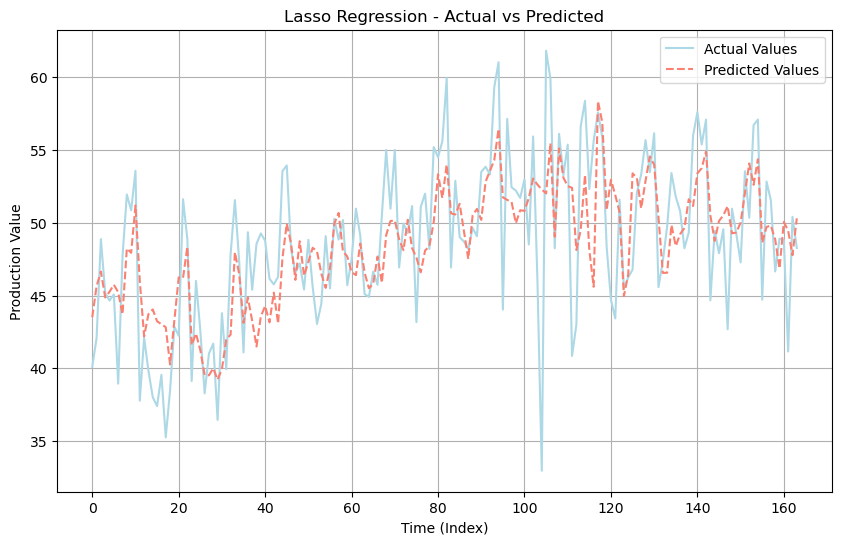

Running GridSearchCV for Decision Tree...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for Decision Tree: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}
Mean Absolute Error: 1.8204817557104143
Mean Squared Error: 6.254471995499419
R² Score: 0.7971607884028464
-----------------------------------------


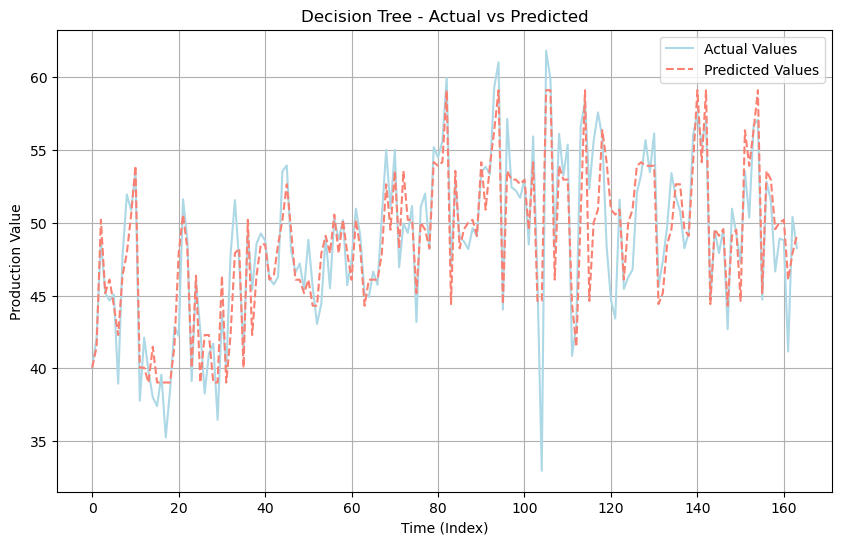

Running GridSearchCV for Random Forest...
Fitting 5 folds for each of 384 candidates, totalling 1920 fits
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 8, 'min_samples_split': 2, 'n_estimators': 100}
Mean Absolute Error: 2.3992542795820753
Mean Squared Error: 10.173587132406485
R² Score: 0.6700596957605374
-----------------------------------------


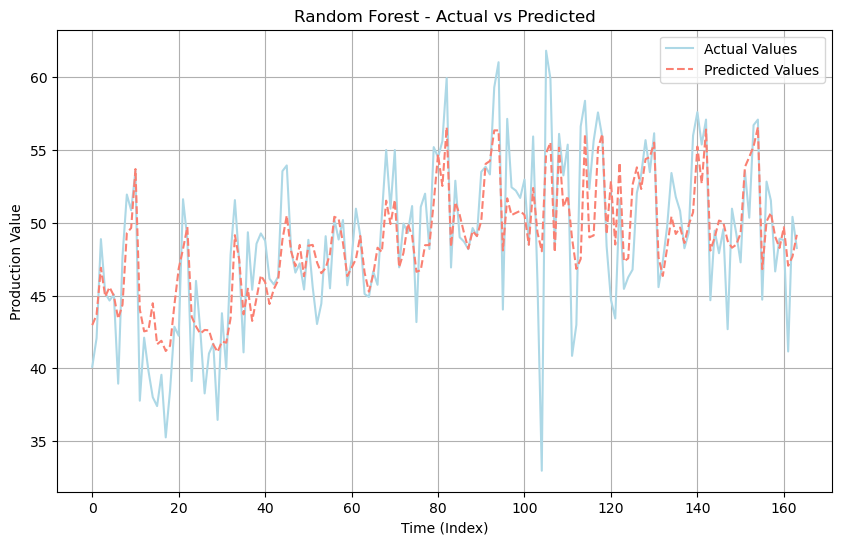

Running GridSearchCV for xgb_model...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters for xgb_model: {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}
Mean Absolute Error: 0.16249046232642175
Mean Squared Error: 0.04865092702512389
R² Score: 0.9984221984384377
-----------------------------------------


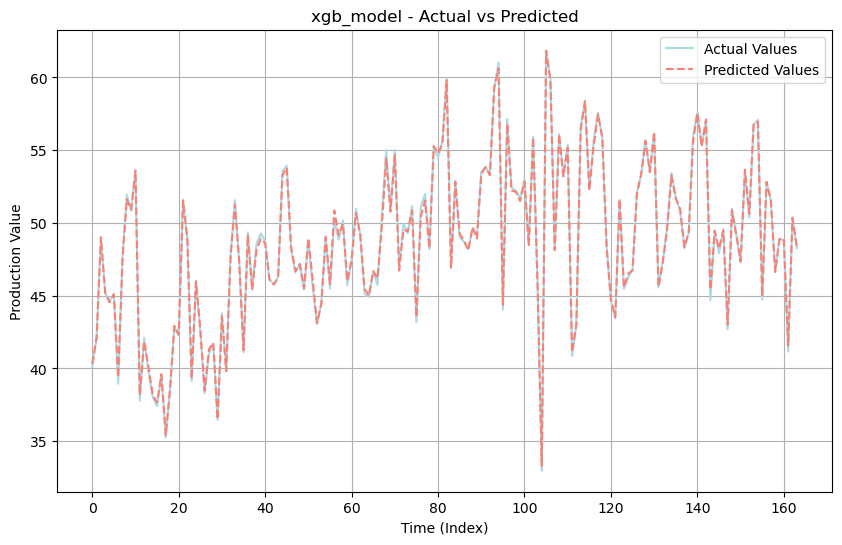

Running GridSearchCV for Neural Network...
Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best parameters for Neural Network: {'activation': 'identity', 'alpha': 0.01, 'hidden_layer_sizes': (100, 100), 'learning_rate': 'constant', 'solver': 'adam'}
Mean Absolute Error: 2.9927337436439942
Mean Squared Error: 15.889438138869814
R² Score: 0.4846885385162334
-----------------------------------------


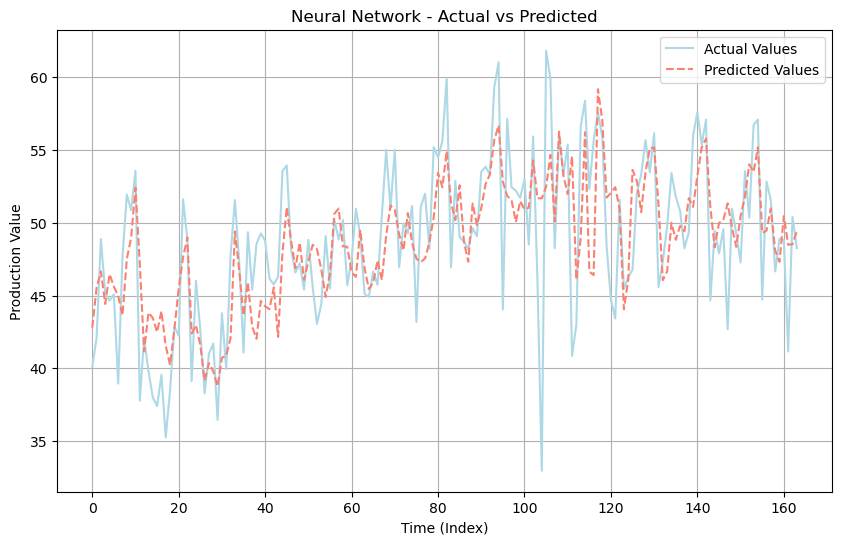

In [413]:
# Apply GridSearchCV for each classifier and evaluate performance metric scores
# Define TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=5)
#this approach divides the dataset into multiple overlapping training and test sets.example:
# Split 1:
# Training: January 2015 – December 2016
# Testing: January 2017
# Split 2:
# Training: January 2015 – January 2017
# Testing: February 2017
# Split 3:
# Training: January 2015 – February 2017
# Testing: March 2017
# and so on


#it creates a better avaliation by testing the data over differents time in the data
for name, classifier in classifiers.items():
    print(f"Running GridSearchCV for {name}...")
    try: #using try and excepet cause I was getting errors from different methods, not it doesnt stop when there is an error
        grid_search = GridSearchCV(estimator=classifier, param_grid=param_grids[name], cv = tscv, n_jobs = -1, verbose = 2)
        grid_search.fit(X,y)
        
        # Best model from grid search
        best_model = grid_search.best_estimator_
        
        # Print the best parameters found by GridSearchCV
        print(f"Best parameters for {name}: {grid_search.best_params_}")
        # Predict on the test set with the best model
        y_pred = best_model.predict(X)
        
        # Regression metrics
        mse = mean_squared_error(y, y_pred)
        r2 = r2_score(y, y_pred)
        mae = mean_absolute_error(y, y_pred)
        
        print(f"Mean Absolute Error: {mae}")
        print(f"Mean Squared Error: {mse}")
        print(f"R² Score: {r2}")
        print('-----------------------------------------')
        # Plot actual vs predicted values
        plt.figure(figsize=(10, 6))
        plt.plot(y.values, label="Actual Values", color="lightblue", linewidth=1.5)
        plt.plot(y_pred, label="Predicted Values", color="salmon", linestyle="--")
        plt.title(f"{name} - Actual vs Predicted")
        plt.xlabel("Time (Index)")
        plt.ylabel("Production Value")
        plt.legend()
        plt.grid()
        plt.show()
        
    except Exception as TypeError:
        # Handle errors gracefully
        print(f"An error occurred while running GridSearchCV for {name}: {TypeError}")
        print('-----------------------------------------')

    #Sarimax better result: MAE: 2.4957261230073824, MSE: 9.856990476905553, R2: 0.4167731522402941

In [161]:
#We can see XGBoost generated the best scores ( I would say perfect prediction)
#R² score close to 1 indicates that XGBoost is a good fit doe this data prediction
#Also the lowest MAE 0.1571

In [162]:
#In the following cells I tested the prediciton using Facebook Prophet but I believe it was getting confused
#with too many models, and I did use prophet in my previous assignment, so I commented it out 
#and you can ignore it

#from prophet import Prophet
# # Define hyperparameter grids for each classifier

# # Assuming `data` is your DataFrame with columns 'Date' and 'Target'
# df_ire_prophet = df_ire_Grid.rename(columns={"Year": "ds", "Value": "y"})

# # Example: 80% train, 20% test
# train_size = int(0.8 * len(df_ire_prophet)) # instead of type an specific date, it gets 80% of my data
# train_pro = df_ire_prophet.iloc[:train_size]
# test_pro = df_ire_prophet.iloc[train_size:]

In [163]:
#train_pro.shape

In [164]:
# from sklearn.model_selection import ParameterGrid

# param_grids = {
#     "Prophet": {
#         "seasonality_mode": ["additive", "multiplicative"],
#         "changepoint_prior_scale": [0.01, 0.1, 0.5],  # Regularization term for trend flexibility
#         "seasonality_prior_scale": [0.1, 1.0, 10.0]  # Regularization term for seasonality
#     }
# }

# # Function to run Prophet with grid search
# def run_prophet(train_data, param_grid):
#     best_score = float('inf')
#     best_model = None
#     for params in ParameterGrid(param_grid):
#         model = Prophet(
#             seasonality_mode=params['seasonality_mode'],
#             changepoint_prior_scale=params['changepoint_prior_scale'],
#             seasonality_prior_scale=params['seasonality_prior_scale']
#         )
#         # Fit the model
#         model.fit(train_data[['ds', 'y']])
        
#         # Predict on training data to calculate MSE (validation step)
#         forecast = model.predict(train_data[['ds']])
#         mse = mean_squared_error(train_data['y'], forecast['yhat'])
        
#         # Update the best model and score
#         if mse < best_score:
#             best_score = mse
#             best_model = model

#     return best_model, best_score

# # Run the function and find the best Prophet model
# best_model, best_score = run_prophet(train_pro, param_grids["Prophet"])

# print("Best Prophet Model:", best_model)
# print("Best Score on Training Data (MSE):", best_score)

# # the best model on the test dataset
# forecast = best_model.predict(test_pro[['ds']])
# test_mse = mean_squared_error(test_pro['y'], forecast['yhat'])

# print("Test MSE:", test_mse)

In [165]:
#future = best_model.make_future_dataframe(periods=30)  # Predict 30 future periods
# forecast_final = best_model.predict(test_pro)
# print(forecast_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

In [166]:
#plot1 = best_model.plot(forecast_final);

In [167]:
# mse = mean_squared_error(test_pro['y'], forecast_final['yhat'])
# r2 = r2_score(test_pro['y'], forecast_final['yhat'])
# mae = mean_absolute_error(test_pro['y'], forecast_final['yhat'])
    
# print(f"Mean Squared Error: {mse}")
# print(f"R² Score: {r2}")
# print(f"Mean Absolute Error: {mae}")

# Prophet result:
# Mean Squared Error: 10.596966941819662
# R² Score: 0.39040826795866246
# Mean Absolute Error: 2.583875952638787

In [168]:
# Comparing with the best score from SearchGrid: Decision Tree, Decision tree is the best model for this time series
# Mean Squared Error: 7.16384471838925
# R² Score: 0.7629575000822717
# Mean Absolute Error: 1.9930963654401155

In [441]:

#generate the supervised data using Ireland full data
lag = 12
df_ire_lagged = create_lag_features(df_ire, lag)


def XGBooster(data,original):
    X = data.drop(columns=['Value'])  # All columns except the value column
    y = data['Value']  #value column only
    
    #TimeSeriesSplit wont be necessary as it was used to get the best parameter in gridsearch spliting the data,
    #but now we use the whole data in supervided format
    #tscv = TimeSeriesSplit(n_splits=5)
    
    #XGBoost with tuned parameters (from GridSearchCV)
    best_params = {
        'colsample_bytree': 0.6, 
        'learning_rate': 0.2, 
        'max_depth': 5, 
        'n_estimators': 50, 
        'subsample': 1.0
    }
    
    model = XGBRegressor(**best_params) #** removes the dictonary
    model.fit(X, y)
    
    #Forecast for the next 36 months
    #it starts with the last 'lag' rows to generate the initial input for forecasting
    forecast_steps = 36
    forecast_values = []  # Store forecasted values
    
    # Use the last lag values as the seed for the forecast
    last_data = original[['Value']].tail(lag).values.flatten().tolist()

    #this loop will create one prediction per time for all the 36months based in the previous lags
    for step in range(forecast_steps):
        # Create data with last 12 values and 12 columns for the lags
        future_input = pd.DataFrame([last_data[-lag:]], columns=[f'lag_{i}' for i in range(1, lag + 1)])
        
        # Predict the next value
        next_value = model.predict(future_input)[0]
        forecast_values.append(next_value) #include it in the forecast data
        
        # Update the 'last_data' with the newly predicted value, do be used in the next prediction
        last_data.append(next_value)
        
   
    forecast_values = np.array(forecast_values).flatten() #convert to 1D otherwise I can not plot it after
    return forecast_values


In [431]:
df_ire_lagged

,Value,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
Year,,,,,,,,,,,,,
2011-01-01,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94,41.16
2011-02-01,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94
2011-03-01,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03
2011-04-01,45.17,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95
2011-05-01,44.66,45.17,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97,42.69
2024-05-01,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97
2024-06-01,41.16,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25


In [433]:
forecast_ire = XGBooster(df_ire_lagged,df_ire)

# Now 'forecast_values' will contain the forecasted values for the next 24 months
print(forecast_ire)

[53.584965 55.85224  51.550617 50.95566  52.322308 52.406635 48.94375
 48.580147 50.96626  51.48022  52.97572  54.80465  56.345284 57.27237
 54.691246 57.04402  53.275017 52.133427 48.974136 47.607273 48.49613
 49.522736 51.59687  53.350822 55.2507   55.846355 56.123806 56.62778
 55.45189  53.906223 49.15237  48.32646  48.88948  48.21082  49.766663
 51.416492]


In [435]:
df_ire_lagged

,Value,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12
Year,,,,,,,,,,,,,
2011-01-01,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94,41.16
2011-02-01,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03,45.94
2011-03-01,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95,52.03
2011-04-01,45.17,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75,44.95
2011-05-01,44.66,45.17,48.88,42.08,40.11,41.82,54.37,48.78,52.71,44.61,43.45,45.44,43.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97,42.69
2024-05-01,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25,50.97
2024-06-01,41.16,48.81,48.91,46.66,51.54,52.83,44.72,57.09,56.71,50.35,53.54,47.28,49.25


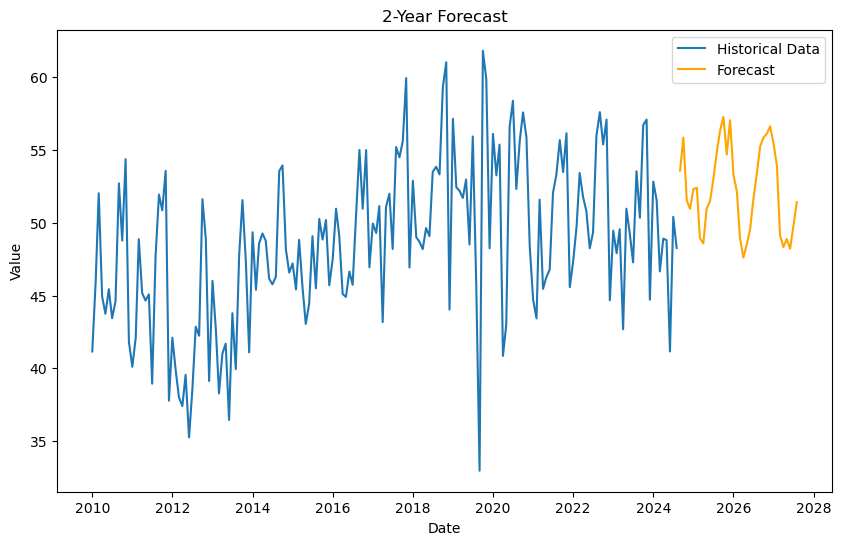

In [437]:
# Create a timeline for the forecast
forecast_index = pd.date_range(start=df_ire.index[-1] + pd.DateOffset(months=1), periods=36, freq='MS')

forecast_ire_df = pd.DataFrame({
    'Date': forecast_index,
    'Value': forecast_ire
})

forecast_ire_df.set_index('Date', inplace=True)

def plot_forecast(a,b):
    plt.figure(figsize=(10, 6))
    plt.plot(a.index, a['Value'], label='Historical Data') 
    plt.plot(b.index, b['Value'], label='Forecast', color='orange')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('2-Year Forecast')
    plt.legend()
    plt.show()

plot_forecast(df_ire,forecast_ire_df)


In [173]:
# Fit the SARIMAX model on the entire dataset
#because SARIMAX incorporate the lags relationships
#and it doesnt need crossvalidation like timeseriessplit as it works with the full data
sarimax_model = SARIMAX(df_ire_dff['Value'], order=(1, 0, 2), seasonal_order=(2, 0, 2, 12))
Smodel = sarimax_model.fit()

#24 months forecast
forecast_steps = 36
Sforecast = Smodel.get_forecast(steps=forecast_steps)

#forecasted values
Sforecast_values = Sforecast.predicted_mean
Sforecast_original = Sforecast_values.cumsum() + df_ire['Value'].iloc[-1] #reverse the difference

# Create a DataFrame for the forecast
Sforecast_index = pd.date_range(start=df_ire_dff.index[-1], periods=forecast_steps + 1, freq='MS')[1:]
Sforecast_df = pd.DataFrame({
    'Value': Sforecast_original,
}, index=Sforecast_index)

# Print the forecast
print(Sforecast_df)

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                Value
2024-09-01  49.546944
2024-10-01  55.678983
2024-11-01  55.076796
2024-12-01  45.998764
2025-01-01  50.252580
2025-02-01  49.817100
2025-03-01  49.500250
2025-04-01  48.199432
2025-05-01  48.035087
2025-06-01  46.038722
2025-07-01  49.883728
2025-08-01  49.737514
2025-09-01  51.964692
2025-10-01  54.969207
2025-11-01  55.221314
2025-12-01  46.226887
2026-01-01  49.554241
2026-02-01  48.728707
2026-03-01  50.429089
2026-04-01  46.971587
2026-05-01  48.325757
2026-06-01  48.098315
2026-07-01  49.488502
2026-08-01  50.608163
2026-09-01  52.171833
2026-10-01  55.114876
2026-11-01  55.677660
2026-12-01  46.340039
2027-01-01  50.102153
2027-02-01  49.250822
2027-03-01  50.517209
2027-04-01  47.559247
2027-05-01  48.558105
2027-06-01  47.864787
2027-07-01  49.886922
2027-08-01  50.678705


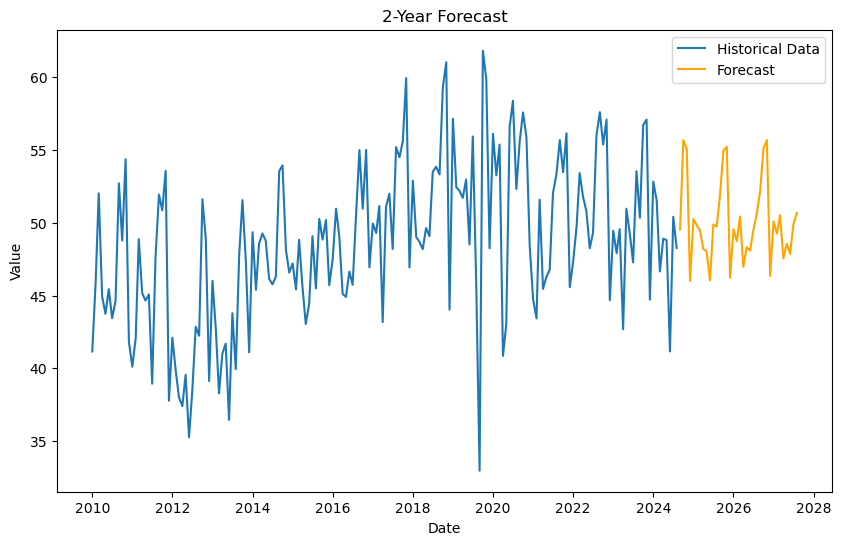

In [174]:
plot_forecast(df_ire,Sforecast_df)

In [175]:
#Samirax looksmore realistic, however it is a forecast for real world not test. So I will keep the forecast made with XGBooster
#due it got a way better accurancy 

#I will check Spanish prediction

In [176]:
df_spa

,Value
Year,
2010-01-01,47.14
2010-02-01,44.90
2010-03-01,50.86
2010-04-01,47.25
2010-05-01,50.64
...,...
2024-04-01,60.74
2024-05-01,66.46
2024-06-01,56.78


In [177]:
df_spa_lagged = create_lag_features(df_spa, lag)
forecast_spa = XGBooster(df_spa_lagged,df_spa)

# Now 'forecast_values' will contain the forecasted values for the next 24 months
print(forecast_spa)

[63.271767 61.298695 61.89878  63.340954 59.738518 61.583706 60.576626
 63.58264  61.02349  62.970642 63.60039  63.029484 63.082283 64.88447
 64.65821  62.561195 63.963696 62.900692 62.61158  60.759678 60.94549
 62.829643 60.979324 62.362186 61.53466  65.984726 64.24352  61.026596
 63.31892  64.99022  63.257645 62.053505 63.398045 62.89228  61.322697
 61.128407]


In [178]:
forecast_spa_df = pd.DataFrame({
    'Date': forecast_index,
    'Value': forecast_spa
})

forecast_spa_df.set_index('Date', inplace=True)

In [179]:
forecast_spa_df

,Value
Date,
2024-09-01,63.271767
2024-10-01,61.298695
2024-11-01,61.898781
2024-12-01,63.340954
2025-01-01,59.738518
2025-02-01,61.583706
2025-03-01,60.576626
2025-04-01,63.582642
2025-05-01,61.023491


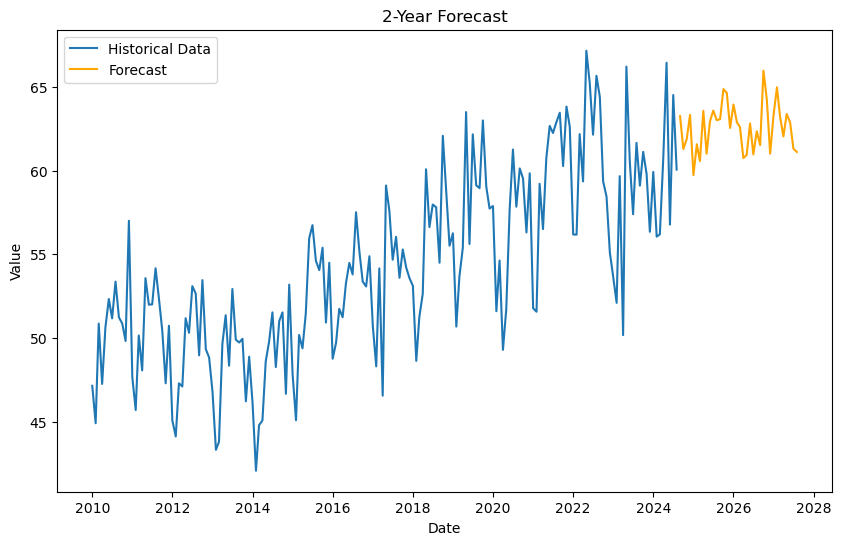

In [180]:
plot_forecast(df_spa,forecast_spa_df)

In [181]:
df_pol_lagged = create_lag_features(df_pol, lag)

In [182]:
forecast_pol = XGBooster(df_pol_lagged,df_pol)
forecast_pol_df = pd.DataFrame({
    'Date': forecast_index,
    'Value': forecast_pol
})

forecast_pol_df.set_index('Date', inplace=True)


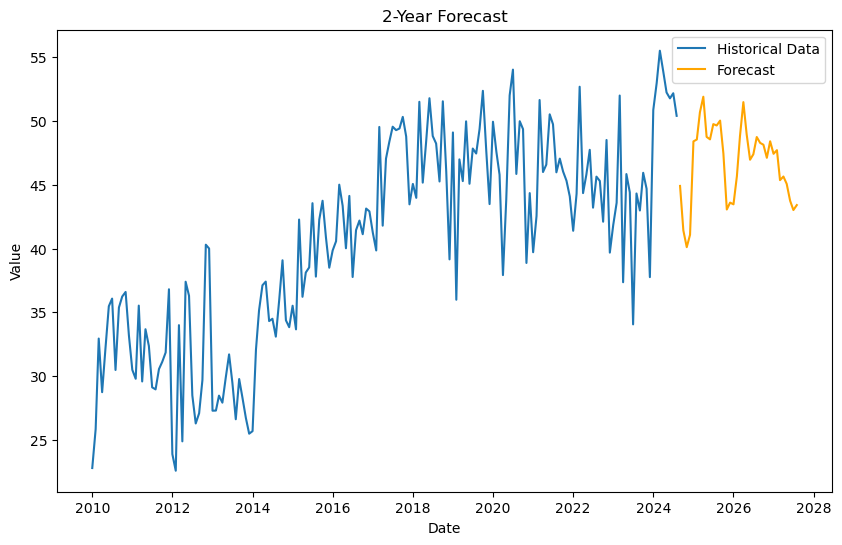

In [183]:
plot_forecast(df_pol,forecast_pol_df)

In [184]:
combined_pol = pd.concat([df_pol, forecast_pol_df])

# Now 'combined_pol' contains both the historical and forecast data
print(combined_pol)

                Value
2010-01-01  22.810000
2010-02-01  25.860000
2010-03-01  32.950000
2010-04-01  28.750000
2010-05-01  32.140000
...               ...
2027-04-01  45.638988
2027-05-01  45.059845
2027-06-01  43.743336
2027-07-01  43.013298
2027-08-01  43.402576

[212 rows x 1 columns]


In [185]:
combined_spa = pd.concat([df_spa, forecast_spa_df])

# Now 'combined_spa' contains both the historical and forecast data
print(combined_spa)

                Value
2010-01-01  47.140000
2010-02-01  44.900000
2010-03-01  50.860000
2010-04-01  47.250000
2010-05-01  50.640000
...               ...
2027-04-01  62.053505
2027-05-01  63.398045
2027-06-01  62.892281
2027-07-01  61.322697
2027-08-01  61.128407

[212 rows x 1 columns]


In [186]:
combined_ire = pd.concat([df_ire, forecast_ire_df])

# Now 'combined_ire' contains both the historical and forecast data
print(combined_ire)

                Value
2010-01-01  41.160000
2010-02-01  45.940000
2010-03-01  52.030000
2010-04-01  44.950000
2010-05-01  43.750000
...               ...
2027-04-01  48.326462
2027-05-01  48.889481
2027-06-01  48.210819
2027-07-01  49.766663
2027-08-01  51.416492

[212 rows x 1 columns]


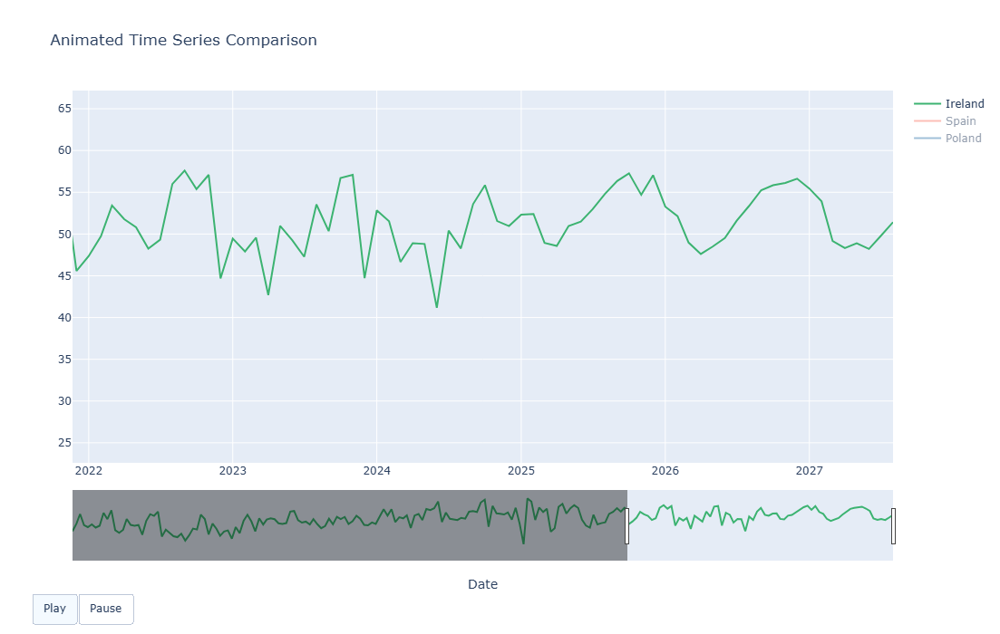

In [427]:
import plotly.graph_objects as go

# merge data to create an animation graph
df_merged2 = pd.merge(combined_ire, combined_spa, left_index=True, right_index=True, suffixes=('_ire', '_spa'))
#merge it again with poland
df_merged = pd.merge(df_merged2,combined_pol, left_index=True, right_index=True)
# Create the figure
fig = go.Figure(
    data=[
        go.Scatter(
            x=df_merged.index,
            y=df_merged['Value_ire'],
            mode='lines',
            name='Ireland',
            line=dict(color='mediumseagreen')
        ),
        go.Scatter(
            x=df_merged.index,
            y=df_merged['Value_spa'],
            mode='lines',
            name='Spain',
            line=dict(color='salmon')
        ),
        go.Scatter(
            x=df_merged.index,
            y=df_merged['Value'],
            mode='lines',
            name='Poland',
            line=dict(color='steelblue')
        )
    ],
    layout=go.Layout(
        title="Animated Time Series Comparison",
        xaxis=dict(
            title='Date',
            range=[df_merged.index[0], df_merged.index[-1]]
        ),
        #define the total range of the data to keep it static, cause the graph was 'growing' as the data was growing
        yaxis=dict(range=[df_merged[['Value_ire', 'Value_spa', 'Value']].min().min(), df_merged[['Value_ire', 'Value_spa', 'Value']].max().max()]),
        showlegend=True,
        width=1000,  # Increase width of the plot
        height=700,
        updatemenus=[dict(
            type='buttons',
            xanchor='left',
            y=-0.35,
            direction='left',
            buttons=[dict(
                label='Play',
                method='animate',
                args=[None, dict(frame=dict(duration=100, redraw=True), fromcurrent=True)]
            ), dict(
                label='Pause',
                method='animate',
                args=[[None], dict(frame=dict(duration=0, redraw=False), mode='immediate')]
            )]
        )]
        #plot_bgcolor='steelblue'
    )
)

#The animation, when click play it starts the loop to go through all the rows
frames = [go.Frame(
    data=[
        go.Scatter(
            x=df_merged.index[:k],
            y=df_merged['Value_ire'][:k],
            mode='lines',
            name='Ireland',
            line=dict(color='mediumseagreen')
        ),
        go.Scatter(
            x=df_merged.index[:k],
            y=df_merged['Value_spa'][:k],
            mode='lines',
            name='Spain',
            line=dict(color='salmon')
        ),
        go.Scatter(
            x=df_merged.index[:k],
            y=df_merged['Value'][:k],
            mode='lines',
            name='Poland',
            line=dict(color='steelblue')
        )
    ],
    name=str(k)
) for k in range(1, len(df_merged) + 1)]

#the range slider at the bottom
fig.update_xaxes(rangeslider_visible=True)

# Add frames to the figure
fig.frames = frames

# Show the plot
fig.show()


In [445]:
pip install streamlit-jupyter

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/123.4 kB ? eta -:--:--
   ------------------------------------ --- 112.6/123.4 kB 3.3 MB/s eta 0:00:01
   ---------------------------------------- 123.4/123.4 kB 2.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/84.1 kB ? eta -:--:--
   ---------------------------------------- 84.1/84.1 kB 4.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [447]:
#import libary to link my code in streamlit
import streamlit as st
from streamlit_jupyter import StreamlitPatcher, tqdm

In [451]:
!streamlit run streamlit.py

Usage: streamlit run [OPTIONS] TARGET [ARGS]...
Try 'streamlit run --help' for help.

Error: Invalid value: File does not exist: streamlit.py


In [455]:
df_merged.to_csv("forecast_final.csv")